In [1]:
from selenium import webdriver
from bs4 import BeautifulSoup
import pandas as pd
import requests
import urllib.request
import time

In [2]:
import pandas as pd 
import numpy as np
import matplotlib as plt
import pandas as pd
import nltk
import re
import numpy as np
from nltk import word_tokenize
from nltk.corpus import stopwords
from string import punctuation
import matplotlib.pyplot as plt
from collections import Counter

#nltk.download()
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to C:\Users\Abhishek's
[nltk_data]     PC\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\Abhishek's
[nltk_data]     PC\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [3]:
df=pd.read_csv("Reviews.csv")

In [5]:
reviews=[]
reviews=df['Text']
reviews[0]

'I have bought several of the Vitality canned dog food products and have found them all to be of good quality. The product looks more like a stew than a processed meat and it smells better. My Labrador is finicky and she appreciates this product better than  most.'

0          263
1          190
2          509
3          219
4          140
5          416
6          304
7          140
8          131
9          137
10         779
11         328
12         399
13          97
14         113
15         155
16         195
17         141
18         746
19         145
20         262
21         323
22         147
23          92
24         274
25         152
26          88
27         196
28         506
29         779
          ... 
568424     275
568425     242
568426     246
568427     155
568428     260
568429     162
568430     169
568431     156
568432     197
568433    1255
568434     271
568435     327
568436     175
568437     132
568438     267
568439     116
568440     807
568441     179
568442     147
568443     728
568444     162
568445     304
568446     271
568447     700
568448     129
568449     149
568450     252
568451     372
568452     200
568453     111
Name: Text, Length: 568454, dtype: int64


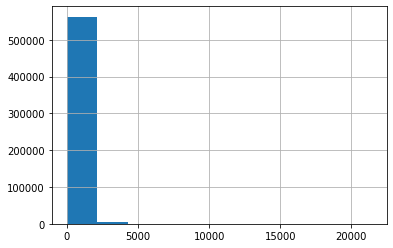

In [6]:
lens =reviews.str.len()
print(lens)
lens.hist()

In [7]:
#tokenising our comments and plotting their term indexes 
def preProcessData(dataa):
    stopwords_en = list(set(stopwords.words('english')))
    def split(word): 
        return [char for char in word]   
    punchList = split(punctuation)

    print(stopwords_en)
    print('Punctuation :', punchList)

    wordTokenList = [word_tokenize(sent) for sent in dataa]
    lowercasingList = [[word.lower() for word in sentence] for sentence in wordTokenList]
    noStopWordList = [[word for word in sentence if word not in stopwords_en] for sentence in lowercasingList]
    noPunchList = [[re.sub(r'([^\s\w]|_)+', '', word) for word in sentence] for sentence in noStopWordList]
    #noPunchList = [[word for word in sentence if word not in punchList] for sentence in noStopWordList]
    PP_data = [[word for word in sentence if word] for sentence in noPunchList]
    return PP_data

PP_data = preProcessData(reviews[0:5000])

['by', 'couldn', 'until', 'too', 'we', "weren't", 'who', 'm', "doesn't", 'for', 'didn', 'needn', "it's", 'ours', 'himself', "won't", 'were', 'no', 'so', "haven't", 'mightn', 're', 'she', 'yourself', 'again', 'then', 's', 'against', 'll', "should've", 'on', 'here', 'before', "shouldn't", 'myself', "hadn't", 'yourselves', 'their', 'because', 'weren', "you've", 'been', 'being', 'don', 'themselves', 'of', 'in', 'those', 'a', 'such', "hasn't", 'over', "she's", 'few', 'that', 'doing', 'herself', 'have', 'and', 'd', 'to', 'will', 'there', 'down', 'an', 'most', 'ma', 'aren', 'any', 'isn', "couldn't", 'where', 'hasn', 'other', 'ain', 'her', 'same', 'not', 'do', 've', 'your', 'all', "you're", 'after', 'did', 'be', 'y', 'my', 'this', 'nor', 'what', 'had', 'when', 'from', 'only', 'into', 'our', 't', 'him', "isn't", 'hadn', 'under', 'out', 'through', 'further', 'these', 'with', 'haven', 'more', 'as', 'off', 'just', 'hers', "didn't", 'having', 'once', 'some', 'which', 'below', "wouldn't", 'i', 'does

In [9]:
all_words=[]
for list_w in PP_data:
    for word in list_w:
        all_words.append(word)

In [10]:
all_text2 = ' '.join(reviews[0:5000])
# create a list of words
words = all_text2.split()
# Count all the words using Counter Method
count_words = Counter(all_words)

total_words = len(words)
sorted_words = count_words.most_common(total_words)

In [14]:
vocab_to_int = {w:i+1 for i, (w,c) in enumerate(sorted_words)}
print (vocab_to_int)

{'br': 1, 's': 2, 'nt': 3, 'like': 4, 'good': 5, 'great': 6, 'taste': 7, 'one': 8, 'product': 9, 'flavor': 10, 'coffee': 11, 'chips': 12, 'love': 13, 'would': 14, 'food': 15, 'tea': 16, 'really': 17, 'get': 18, 'much': 19, 'best': 20, 'also': 21, 'use': 22, 'buy': 23, 'little': 24, 'time': 25, 've': 26, 'tried': 27, 'better': 28, 'make': 29, 'find': 30, 'price': 31, 'amazon': 32, 'bag': 33, 'even': 34, 'try': 35, 'mix': 36, 'm': 37, 'hot': 38, 'well': 39, 'chocolate': 40, 'water': 41, 'eat': 42, 'dog': 43, 'first': 44, 'made': 45, 'could': 46, 'box': 47, 'sugar': 48, 'used': 49, 'found': 50, 'bought': 51, 'flavors': 52, 'free': 53, 'recommend': 54, 'brand': 55, 'cup': 56, 'since': 57, 'sweet': 58, 'order': 59, 're': 60, 'think': 61, 'delicious': 62, 'way': 63, 'many': 64, 'store': 65, 'still': 66, 'know': 67, 'salt': 68, 'two': 69, 'bit': 70, 'favorite': 71, 'got': 72, 'go': 73, 'nice': 74, 'bags': 75, '2': 76, 'tastes': 77, 'say': 78, 'without': 79, 'drink': 80, 'ca': 81, 'add': 82, '

In [17]:
reviews_ns=[]
for list_w in PP_data:
    text=' '.join(list_w)
    reviews_ns.append(text)
    

In [18]:
len(reviews_ns)

5000

In [19]:
ixtoword = {}
wordtoix = {}
ix = 1
for w in all_words:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1

In [20]:
import os
root_path = os.getcwd()
root_path

"C:\\Users\\Abhishek's PC\\Desktop\\datasets\\HACKATHON-Text to key_words"

In [21]:
glove_dir = 'glove'
embeddings_index = {} # empty dictionary
f = open(os.path.join(glove_dir, 'glove.6B.200d.txt'), encoding="utf-8")
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

In [24]:
word_arr=[]
# for num,word in ixtoword:
for list_w in PP_data:
    temp=[]
    for word in list_w:
        temp.append(wordtoix[word])
    word_arr.append(temp)

In [26]:
word_arr[0][1]

200680

In [27]:
pp_new=[]
for list_w in PP_data:
    temp=[]
    for word in list_w:
        print(word)
        if word in embeddings_index.keys():
            temp.append(word)
    pp_new.append(temp)

bought
several
vitality
canned
dog
food
products
found
good
quality
product
looks
like
stew
processed
meat
smells
better
labrador
finicky
appreciates
product
better
product
arrived
labeled
jumbo
salted
peanuts
peanuts
actually
small
sized
unsalted
sure
error
vendor
intended
represent
product
jumbo
confection
around
centuries
light
pillowy
citrus
gelatin
nuts
case
filberts
cut
tiny
squares
liberally
coated
powdered
sugar
tiny
mouthful
heaven
chewy
flavorful
highly
recommend
yummy
treat
familiar
story
cs
lewis
lion
witch
wardrobe
treat
seduces
edmund
selling
brother
sisters
witch
looking
secret
ingredient
robitussin
believe
found
got
addition
root
beer
extract
ordered
good
made
cherry
soda
flavor
medicinal
great
taffy
great
price
wide
assortment
yummy
taffy
delivery
quick
taffy
lover
deal
got
wild
hair
taffy
ordered
five
pound
bag
taffy
enjoyable
many
flavors
watermelon
root
beer
melon
peppermint
grape
etc
complaint
bit
much
redblack
licoriceflavored
pieces
particular
favorites
kids
husb

nt
wet
food
box
couple
cans
came
home
surprise
realized
could
save
20
time
bought
dog
food
buy
amazon
br
br
definitely
recommend
give
stamp
approval
natural
balance
dog
food
never
eaten
dog
seems
love
food
get
pet
store
s
delivered
door
price
slightly
less
ve
pleased
natural
balance
dog
food
dogs
issues
dog
foods
past
someone
recommend
natural
balance
grain
free
since
possible
allergic
grains
since
switching
nt
issues
also
helpful
different
kibble
size
largersmaller
sized
dogs
112
year
old
basenjijack
russell
mix
loves
dog
food
s
noticeably
healthier
energetic
since
switched
standard
dog
foods
earlier
year
despite
higher
cost
natural
dog
foods
find
eats
significantly
less
natural
balance
dog
foods
still
stays
happy
full
normal
dog
foods
d
eat
3
cups
dog
food
day
recommended
serving
size
whereas
eats
1
cup
112
cup
natural
balance
dog
food
day
take
account
re
actually
getting
bang
buck
natural
dog
foods
since
nt
buy
much
last
long
normal
dog
foods
healthier
happier
dog
boot
add
fact
get


plenty
30
minutes
ready
bed
woke
refreshed
sleepydrug
hangover
huge
bonus
br
br
gave
product
3
stars
instead
5
deserves
packing
job
marginal
best
product
arrived
2
broken
bottles
price
6
loss
bottles
glass
wrap
one
layer
smallbubbled
bubble
wrap
around
case
placed
larger
box
extra
room
move
around
box
big
packing
fail
product
awesome
made
chocolate
chip
cookies
brm
garbanzo
bean
flour
results
fantastic
brown
sugar
chocolate
mask
bean
taste
reviews
mentioned
friends
could
nt
discern
difference
classic
cccs
texture
body
elasticity
meaning
reduced
tendency
fall
apart
occurs
glutenfree
flours
nice
chewy
cccs
made
regular
flour
added
bonus
high
protein
fiber
level
calculate
23
g
fibercookie
fills
satisfied
smaller
servings
glycemic
index
significantly
lower
br
br
highly
recommend
flour
even
cccs
thing
make
great
stuff
made
really
tasty
banana
bread
good
quality
lowest
price
town
trouble
finding
locally
delivery
fast
hunting
flour
aisle
local
grocery
stores
packet
glaze
secret
making
europea

unnatural
plastic
bag
great
service
items
arrived
faster
expected
efficient
use
seller
highly
recommend
seller
thank
excellent
service
please
ignore
onestar
comments
check
bag
main
ingredient
fact
whole
grain
brown
rice
second
rice
flower
anything
gluten
free
add
another
binder
corn
flour
comes
someone
celiac
disease
sunchips
contain
wheat
key
binder
chip
cookie
cereal
excellent
product
spouse
buy
lot
gluten
free
absolutely
delicious
best
flavor
ever
m
addicted
good
far
best
could
live
need
anymore
say
many
healthy
products
nt
taste
good
taste
good
first
try
go
downhill
ve
chips
one
occasion
tasty
ve
served
guests
twice
times
wanted
know
get
s
also
nice
something
glutenfree
friends
borderline
diabetic
would
eat
anyway
found
crisps
local
walmart
figured
would
give
try
yummy
may
never
go
back
regular
chips
big
chip
fan
anyway
problem
eat
entire
bag
one
sitting
give
crisps
big
thumbs
one
best
tasting
crisps
ever
eaten
buy
special
occassions
know
ll
eat
whole
bag
paid
179
2
ounce
pkg
lunch

like
mix
pancakes
came
delicious
fluffy
br
one
small
secret
try
add
seltzer
water
instead
regular
one
appreciate
fact
buy
product
online
free
shipping
great
around
mix
good
wonderful
texture
thanks
amazon
arrowhead
mills
buttermilk
pancake
mix
favorite
mix
tastes
great
cooks
light
fluffy
super
easy
make
although
made
using
water
think
s
better
made
milk
love
pure
organic
maple
syrup
pancakes
taste
great
without
recipe
adjustments
son
s
egg
allergy
s
also
great
camping
time
d
like
able
make
pancakes
without
fresh
eggs
available
hey
great
waffles
pancakes
add
50
mix
tho
recipies
bag
thin
lot
fun
arrowhead
mills
buttermilk
pancake
waffle
mix
serve
fried
eggs
real
maple
syrup
href
http
wwwamazoncomgpproductb002483tsq
butternut
mountain
farm
vermont
pure
maple
syrup
grade
dark
amber
1
pint
jug
a
warm
strawberry
jam
whipped
cream
cool
whip
add
brown
sugar
mix
change
flavor
make
crispy
waffle
add
14
cup
sugar
14
cup
malted
milk
powder
href
http
wwwamazoncomgpproductb001eq4hvc
carnation
malted

vinegar
buffalo
bleu
favorite
perhaps
worst
chips
ever
gone
mouth
br
br
entire
life
sour
cream
onion
case
chive
chips
favorite
recently
kettle
brand
honey
dijon
mustard
took
slot
found
sour
cream
onion
try
them
br
br
soon
opened
bag
chips
smelled
powdered
milk
indeed
chip
coated
powdered
sour
cream
awful
tastes
like
rancid
milk
sour
like
sour
cream
rancid
powdery
texture
also
extremely
unappealing
basically
hated
chips
would
recommend
chips
anyone
unless
particular
affinity
powdery
chalky
texture
chip
rancid
onion
flavor
hard
time
believing
person
exists
br
br
plan
contacting
kettle
sharing
thoughts
hopefully
ll
reassess
seasoning
otherwise
wonderful
kettle
style
chips
kettle
chips
look
feel
taste
like
lays
chips
used
favorite
crinkle
cut
hefty
longer
favorite
great
price
excellent
chip
80
cents
2
ounce
bag
bargain
well
tasty
chip
everyone
ve
let
try
impressed
commented
good
taste
ve
yet
find
kettle
chip
disappointed
love
chips
bought
stock
entire
school
year
chips
taste
great
packages

would
ask
kettle
change
texture
s
slightly
hardcrunchy
problem
would
prefer
softer
kettle
make
happen
please
keep
everything
else
thank
favorite
nt
everybody
way
sort
taste
like
oriental
flavor
ramen
kick
one
go
wrong
combination
jalapeno
ginger
bit
rich
nt
everydayforamonth
snacking
case
purchase
recommend
trying
single
bag
buying
entire
case
2oz
size
seems
longer
available
shame
eat
entire
5oz
bag
salt
vinegar
chips
favorite
flavor
think
ve
tried
every
brand
far
best
also
like
sodium
content
high
like
others
excessively
greasy
seem
right
balance
salt
vinegar
taste
package
arrived
double
boxed
wrapped
inside
box
holds
goods
perfect
single
dent
rough
mark
outstanding
packaging
br
br
product
br
br
best
chips
planet
salt
n
vinegar
flavor
beyond
among
best
chips
ve
ever
might
actually
m
sure
probably
wo
nt
like
first
bite
if
never
try
again
br
br
mention
particular
flavor
held
numerous
surveys
comparisons
manufactures
love
jalapeno
chips
kettle
must
try
br
nice
cruncy
kick
jalapeno
br
del

ever
ve
tried
conventional
kettle
crinkle
chip
verson
salt
peper
ca
nt
compare
easily
spicy
chips
ever
eat
oompletely
enjoyable
finish
bag
indside
coated
spices
great
stuff
best
tasting
tortilla
chips
ever
become
allergic
tomatoes
love
tortilla
chips
much
flavor
chips
longer
miss
pico
de
gallo
prefer
eat
plain
also
right
amount
heat
make
flovorful
overpoweringly
spicy
potato
chips
delicious
potato
chips
approximately
two
years
difficult
find
organic
chips
amazon
lowered
price
finally
chance
order
definitely
ordering
family
love
pure
void
artificial
flavorings
true
flavor
present
satisifies
need
something
salty
sweet
spicy
crunchy
a
chips
great
snack
nt
want
junk
assiciated
chips
try
ll
like
love
chips
flavor
plain
sweet
spicy
time
drawback
tad
bit
much
salt
still
great
flavor
thesedo
nt
like
hot
food
might
bit
much
great
balance
sweetness
spice
course
kettle
chips
good
chips
use
good
oil
make
even
plain
ones
tasty
also
like
ridged
chips
usually
crunchy
hard
chew
nt
want
work
hard
delic

buy
quality
ferret
loves
rabbit
s
nice
high
protein
treat
addition
regular
evo
ferret
diet
price
reasonable
compared
local
pet
store
nt
often
item
stock
son
made
nt
patience
precise
water
temperature
half
hour
done
appeared
risen
feared
worse
determined
polite
agreed
sandwich
using
bread
amazing
apparently
rises
baking
something
br
br
great
tangy
flavor
perfect
meat
sandwich
imho
heavy
fortunately
lots
deli
meats
since
whole
loaf
disappeared
within
hour
br
br
ve
sourdough
peasant
bread
far
m
sure
delicious
well
great
described
used
beethemed
party
use
go
packs
honey
coffee
tea
disco
dust
edible
made
baking
purchase
product
purposes
happy
quick
shipping
needed
school
product
daughter
came
roof
broken
corner
house
broken
could
nt
send
back
needed
project
really
easy
project
family
fun
anytime
christmas
put
icing
cookies
stack
ice
outside
decorate
great
ages
strawberry
licorice
rope
looks
like
stuck
together
find
end
unwind
br
br
caution
3
small
hard
candy
decorations
swallowing
hazard
br

disappionted
opened
shipment
enjoy
life
go
bars
berry
carmel
apple
cocoa
loco
boxes
plain
generic
designyou
know
kind
brands
change
want
make
products
look
cheaper
compared
ingredients
new
shipment
older
boxes
still
home
guess
cheaper
ingredients
next
tastetested
let
3
year
old
help
would
nt
eat
new
ones
ca
nt
blame
oily
bland
thought
enjoy
life
brand
actually
cared
using
quality
ingredients
make
goodtasting
product
wrong
summary
way
expensive
made
lowquality
unpalatable
ingredients
refer
picture
posted
bar
half
size
think
going
literally
twobite
bar
deceptive
advertising
fact
ridiculously
expensive
reason
one
star
10
year
old
son
ate
one
nt
like
ate
one
agreed
husband
could
nt
give
away
everyone
different
tastes
tasty
treat
far
m
concerned
allergies
family
ended
working
great
nt
negative
reactions
ingredients
though
nt
buy
many
pre
packaged
foods
work
onthego
family
tried
several
varieties
prefer
cocoa
loco
bars
re
almost
like
tootsie
roll
methough
ca
nt
eat
tootsie
rolls
great
substi

surprised
find
amazon
stumbled
across
would
highly
recommend
anyone
likes
good
hot
sauce
browsing
around
amazon
looking
gifts
pleased
see
favorite
sauce
order
shipped
friends
habanero
favorite
love
heat
tangy
spiciness
also
love
pineapple
go
wrong
ordering
favorite
hot
sauce
buy
locally
love
flavor
hopefully
flavors
show
amazon
people
enjoy
favorites
medium
pineapple
flavored
ones
far
thank
making
flavorful
hot
sauce
far
habanero
medium
sauces
amazing
fiance
use
nearly
daily
picked
3
goes
really
well
sorts
dishes
add
extra
kick
br
br
sauce
lasts
lot
longer
appears
thick
bottle
last
us
couple
weeks
heavy
use
love
use
breakfast
eggs
burritos
dinners
soups
added
spice
absolutely
love
habenaro
sauce
use
eggs
sandwiches
anything
good
kick
watched
progessing
popularity
theis
homegrown
product
nothing
highes
accolades
chef
productget
try
black
market
hot
sauce
wonderful
husband
loves
habenero
sauce
flavorful
nice
kick
fact
love
medium
sauce
taste
yummy
bit
zing
behind
used
everything
use
meal

zesty
slightly
sweet
spicyit
s
like
combination
sweet
tart
oils
chips
better
health
hard
put
bag
down
br
br
made
detroit
michigan
contain
trans
fats
s
good
enough
try
favorite
chips
planet
light
crisp
greasy
flavor
dilly
love
great
chips
hard
find
chips
really
good
taste
better
name
brands
re
cheaper
nt
salty
like
brands
flavors
blend
really
well
right
amount
sour
cream
onion
flavor
little
salt
mixed
start
eating
s
hard
stop
lol
br
br
definitely
buying
potato
chips
rather
another
name
brand
sure
state
name
brand
4
bags
chips
open
received
shipment
hoping
chips
br
blew
open
shipment
flight
chips
amazon
otherwise
br
chips
good
eat
salty
thick
kettle
chips
past
definitely
like
potato
chip
college
crowd
loves
interestingly
enough
feel
gourmet
eating
flavor
heavily
garlic
easily
taste
cheese
ordered
uncle
rays
bbq
chips
many
times
always
pleased
except
order
br
seasoning
usual
generally
lacked
much
taste
sure
reduced
seasoning
processing
case
bought
opened
thrown
away
3
bags
already
disappo

customers
premier
company
hard
find
anymore
along
omaha
prime
rib
great
two
plenty
fill
made
toaster
oven
less
20
minutes
received
4
first
ever
omaha
steaks
order
received
today
nt
sure
expect
far
ve
pleased
tore
plastic
open
put
frozen
potato
baking
sheet
oven
put
350
45
minutes
later
done
turned
delicious
cheese
filling
crispy
ontop
potato
underneath
nice
soft
way
would
come
good
put
microwave
d
say
oven
cooking
definitely
way
go
obviously
make
stuffed
baked
potatoes
far
cheaper
omaha
charges
alone
long
get
good
deal
omaha
website
simply
make
great
addition
omaha
steaks
order
delicious
though
would
nt
order
box
site
due
added
shipping
costs
like
said
long
re
part
nicely
priced
packaged
deal
ll
definitely
take
actually
probably
would
nt
order
packaged
deal
future
omaha
nt
include
big
plus
least
check
ingredients
list
s
partially
hydrogenated
oils
s
traces
trans
fats
rare
stuffed
baked
potatoes
also
high
fructose
corn
syrup
another
rarity
food
product
like
always
plus
make
buy
frozen
g

said
delicious
wonderful
product
br
br
bread
mixes
tried
amazon
disappointing
br
br
back
make
great
christmas
presents
figured
must
bacon
like
bacon
used
certain
age
40
50
remember
deep
smoky
flavor
good
bacon
found
store
bacon
anymore
modern
bacon
thin
lightlypoorly
smoked
even
socalled
gourmet
bacon
old
fashioned
flavor
thickness
bacon
way
good
old
days
arrives
nice
cool
ice
pack
cheaper
buy
12pack
love
dont
use
much
strong
tastes
great
makes
even
mediocre
salmon
taste
great
thin
crisp
fragrant
cookies
delicious
tasty
excellent
glass
cold
almond
milk
hot
herbal
tea
choices
like
ginger
snaps
love
lars
ginger
snaps
ginger
cookies
nt
look
anymore
found
cookie
ate
entire
box
share
hubby
said
order
get
2
boxes
cause
would
like
some
good
tasty
authentic
flavor
ordered
last
minute
christmas
knowing
going
arrive
time
arrived
house
christmas
eve
nt
time
make
year
thought
would
buy
never
buy
cookies
would
buy
son
loved
thing
dip
white
chocolate
br
thanks
ya
know
re
glutenfree
diet
yearn
forbid

flavor
goes
ok
ve
tried
several
compleats
line
including
one
one
thing
common
picture
box
looks
like
lot
food
moderate
amount
sauce
box
actually
contains
moderate
amount
food
lot
sauce
it
br
br
chicken
rice
flavor
shredded
chicken
rice
carrots
peas
whole
lot
chickeny
flavored
sauce
s
salty
lacking
chicken
flavor
texture
ingredients
decent
neither
firm
mushy
except
ratio
sauce
solid
food
saucy
overall
d
say
s
fine
pinch
shelfstable
meals
easier
find
options
available
fairtomiddlin
radiationtreated
dinners
nt
need
freezing
great
convenience
ve
tried
quite
hormel
compleats
one
favorites
home
cookin
ai
nt
s
bit
salty
satisfying
meal
90
seconds
s
hard
beat
reason
ve
given
flavorful
decently
chickenfilled
dish
4
stars
instead
5
rice
white
know
whole
grains
healthier
companies
start
making
dishes
whole
wheat
pasta
brown
rice
ll
mark
subscribe
several
hormel
compleats
definitely
best
flavored
dinner
tried
planning
double
subscription
like
majority
meals
hormel
line
one
excessively
salty
alone


decaf
french
vanilla
could
find
decided
switch
old
brand
one
far
best
pudding
mix
nt
see
store
shelves
everyone
seems
buy
milk
chocolate
pudding
guess
nt
like
cook
pudding
stove
best
pudding
cooked
cooked
instant
pudding
equal
this
carl
ve
searching
everywhere
locally
putting
elated
find
amazon
pudding
mother
made
chocolate
pies
tradition
continues
thank
much
amazon
come
sent
instant
chocfudge
pudding
br
order
told
send
cook
serve
chocfudge
pudding
br
show
picture
br
could
nt
send
br
makes
wonder
order
anything
else
br
pissed
honey
serious
sweet
tooth
accommodate
preparing
weekly
dessert
martha
white
s
muffin
mix
convenient
prepare
requires
onehalf
cup
milk
toss
cuisinart
wahla
six
beautiful
muffins
virtually
prep
time
moist
delicious
economic
followed
easy
instructions
turned
delicious
ate
6
mixed
12
cup
milk
dry
mix
slowly
mixed
together
poured
mix
sprayed
cast
iron
6
cup
muffin
pan
cooked
small
convection
oven
cooked
nicely
moist
inside
mixes
fresh
smelling
freshness
date
well
2013


two
popchips
great
fresh
arrived
price
wish
bags
chips
bucks
aboulutely
love
popchips
first
tried
healthy
chips
marathon
california
like
variety
pack
got
try
alot
flavors
ive
never
product
everything
according
advertisement
totally
satisfied
purchase
recommend
everyone
purchase
chips
site
popchips
new
product
ordered
seeing
ad
weight
watchers
magazine
loved
product
packing
perfect
shipping
went
fine
complaints
order
probably
order
soon
watch
calories
tend
successful
food
eat
tasteless
enjoyed
six
flavors
popchips
feel
great
eating
100
calories
per
bag
favorites
sour
cream
onion
sea
salt
vinegar
flavors
fact
re
good
want
keep
eating
resist
opening
second
bag
really
defeats
purpose
like
variety
pack
s
bad
value
product
exactly
portrayed
tasty
yummy
good
received
product
promptly
ordered
2
cases
eat
every
package
love
chips
taste
good
low
cal
diet
perfect
individual
bags
keep
honest
thank
popchips
delicious
husband
love
especially
bbq
salt
vinegar
flavors
like
individual
packages
s
wonder

like
buy
small
packages
limit
portion
size
also
lot
chips
one
little
bag
also
makes
really
convenient
grab
bags
take
work
throw
car
nt
kids
small
bags
would
nice
kids
well
son
daughterinlaw
told
chips
purchased
bags
store
say
higher
stores
get
online
amazon
brought
bag
hooked
ordered
popchips
online
best
chips
nt
flavor
nt
like
family
nt
like
chipaholic
better
great
tasting
chip
highly
recommend
anyone
ca
nt
without
eating
chips
either
sandwich
hamburger
munch
midday
br
wo
nt
dissapointed
popchips
great
heard
really
good
totally
agree
love
able
flavors
like
variety
br
chips
delivered
quickly
safely
love
popchips
especially
individual
portion
sizes
variety
flavors
good
tastes
great
easy
put
lunches
snacks
go
describe
popchip
would
say
s
hybrid
potato
chip
popcorn
cake
little
skeptical
first
since
trying
figure
made
nt
baked
fried
pleasantly
surprised
tried
variety
pack
gives
people
good
opportunity
try
six
different
flavors
decide
ones
favorite
re
snacker
looking
healthier
alternative
f

order
amazon
gold
box
even
better
price
think
average
price
per
bag
came
approximately
forty
six
cents
bag
free
shipping
prime
account
greatest
potato
snack
products
ve
found
2
points
weight
watchers
really
crispy
tasty
flavors
great
complaint
s
difficult
open
little
bags
need
pair
scissors
guess
keeps
fresher
longer
s
great
trade
would
recommend
chips
everyone
really
like
chips
different
texture
regular
potato
chips
still
find
really
tasty
even
boyfriend
often
averse
things
healthy
low
fat
gobble
rather
quickly
variety
packs
great
allow
little
bit
everything
course
downside
may
like
flavors
much
find
original
version
little
bland
sea
salt
vinegar
flavor
might
strong
people
potato
chipaddicted
nt
enjoy
potato
chips
also
enjoy
type
potato
product
product
really
hit
mark
me
br
br
consider
fullfledged
snack
bag
packed
chips
moderately
seasoned
full
flavor
consistency
slightly
like
popcorn
cake
re
crisp
crunchy
puffy
distinct
potato
taste
br
br
best
part
bag
clocks
100
calories
repeat
simp

crunchy
pieces
fine
much
soft
fruit
discard
albeit
item
good
frozen
added
fruit
make
smoothie
s
nt
taste
slime
edit
noticed
bag
176
pounds
22
review
2
stars
instead
three
br
br
first
probably
guess
pictures
sour
gummies
nt
said
description
also
one
2
2
12
inches
length
12
inch
wide
br
br
texture
flavor
came
soft
texture
gummies
peach
rings
sourness
average
overwhelming
little
took
2
stars
flavor
important
part
chewed
different
flavors
hit
tongue
none
tasted
great
could
nt
make
inparticular
good
anyways
combination
plain
strange
br
br
could
see
getting
one
bag
probably
give
3
away
nephewsniece
eat
anything
sugar
coated
right
m
big
fan
dirty
martini
simply
ca
nt
eat
enough
olives
keep
br
br
love
stuff
quite
tangy
dirty
sue
still
vibrant
reorderd
product
many
times
makes
great
dirty
martinidelivery
prompt
product
well
packed
excellent
product
always
ran
olive
juice
ran
olives
making
dirty
martinis
terrific
source
great
tasting
olive
juice
dirty
martinis
never
better
last
case
different
br

pancakes
time
great
waffle
mix
allergies
preservatives
find
food
general
great
tasting
without
preservatives
huge
challenge
tried
several
mixes
one
far
best
totally
nt
understand
reviews
bad
taste
chemicals
read
labels
mixes
see
one
full
ingredients
certain
kinds
ingredients
mixes
need
levening
use
real
butter
tub
butter
contains
water
nasty
stuff
best
waffles
ever
lands
gormet
category
sure
pancakes
like
going
resturant
exceptional
pancakes
would
expect
get
home
price
bit
high
know
buy
fair
downgrade
product
bnecause
that
br
br
cook
nicely
one
pack
two
goes
long
time
use
base
waffles
use
2
small
bananas
mashed
34t
cinammon
1t
vanilla
12
cup
gratted
pecans
blend
together
need
let
cook
much
longer
period
time
lower
normal
temperature
need
cut
back
amount
water
used
need
know
consistency
waffle
mixture
attempt
recipe
determine
amount
water
use
somewhat
tricky
recipe
since
s
easy
waffles
stick
pull
apart
one
banana
makes
easier
ve
success
three
bananas
banana
s
better
overripe
m
normally


tells
healthier
choice
baby
typical
grocery
store
aisle
alternative
like
keep
car
diaper
bag
helping
calm
little
one
waiting
meal
etc
nt
think
taste
awesome
sure
eats
like
going
disappear
makes
happy
love
cheddar
carrot
flavor
far
better
green
flavor
daughter
age
2
likes
snack
car
opt
cheddar
carrot
tasty
love
healthy
feel
great
giving
instead
brightly
colored
mystery
things
love
em
two
boys
love
happy
munchies
cheddar
cheesecarrot
request
snack
watch
show
tv
love
low
sodium
includes
25mg
choline
per
serving
great
eyes
tastes
great
also
kosher
certified
plus
well
love
put
baggies
keep
purse
emergency
snacks
go
healthy
crunchy
must
buy
1
year
old
son
really
like
these
andthey
certainly
taste
better
finger
food
snacks
issue
lots
crumbs
come
gets
messy
want
dump
baggie
go
great
alternative
chips
nt
sure
would
based
reviews
glad
bought
wish
would
found
sooner
twin
18
month
olds
ca
nt
get
enough
like
son
9mo
ca
nt
say
yet
loves
gets
excited
even
take
pantry
like
fact
organic
also
carrots
so

picture
claims
dop
certified
neither
appears
true
cans
received
certified
nt
say
usda
organic
label
either
also
knew
things
bought
since
well
documented
amazon
reviews
already
nt
surprised
received
br
br
plus
side
better
tomatoes
buy
canned
grocery
stores
locally
m
happy
enough
used
reward
points
amazoncom
visa
buy
essentially
free
me
br
br
would
buy
maybe
could
nt
get
strianese
dop
certified
san
marzano
tomatoes
yes
probably
would
said
tasty
like
better
buy
locally
nt
top
tomato
comes
mail
order
discovered
wonderful
tomatoes
yes
worth
paying
unfortunately
area
approaching
6
bucks
never
go
sale
walmart
4
dollars
prefer
tied
store
local
italian
mart
advertised
san
marzano
tomatoes
4
cans
5
dollars
good
true
yes
fact
ordinary
tomatoes
hunt
wonderful
tomatoes
good
pricethey
turn
ordinary
recipe
gourmet
experience
shown
says
dop
certified
relative
ordered
amazoncom
cans
shipped
indicate
certified
one
buy
nondop
walmart
mean
certified
certified
br
br
unfortunately
venders
making
fools
amazo

juice
cheaper
tart
smart
may
providing
anti
oxidents
say
completely
failed
helping
sleep
better
night
returned
1
bottle
amazon
went
back
tart
smart
used
wake
34
times
night
trouble
getting
back
sleep
nearly
80
retired
sleep
choose
tis
formula
get
sleep
fairly
quick
wake
7
hours
later
get
anothert
hour
two
visiting
bathroom
product
may
work
much
better
found
one
works
stick
forever
hope
read
opinion
product
soon
much
white
pith
orange
peel
making
product
overly
bitter
diluting
real
good
taste
orange
zest
managed
find
crackers
countries
travels
run
love
individually
wrapped
small
packets
stay
fresh
container
makes
great
carry
purse
take
work
airplanes
snacks
etc
also
love
overly
salted
like
many
american
brand
crackers
company
shipped
great
job
fast
best
tasting
cracker
ve
ever
tasted
may
cost
less
filipino
asian
store
well
good
unless
nt
live
close
one
nt
note
box
says
1
pound
14
ounces
description
page
says
28z
whatever
z
meant
oz
s
incorrect
s
30oz
box
case
able
find
even
cheaper
onli

nice
full
body
even
keurig
set
oversize
setting
s
favorite
blend
go
bold
varieties
coffee
mahogany
bold
smooth
time
favorite
far
kcup
ve
found
thats
tastes
great
normal
brew
s
watered
like
regular
stuff
dose
nt
taste
burnt
like
bold
stuff
kcup
m
buying
ve
tried
every
coffee
brand
available
keurig
one
far
best
s
extraordinarily
smooth
rich
closest
starbucks
s
thing
add
healthy
splash
bolthouse
coffeemocha
good
mahogany
smooth
full
bodied
character
highly
recommend
coffee
drinkers
looking
bold
overpowering
taste
coffee
really
bold
opinion
falls
along
medium
roast
flavor
s
decent
smooth
coffee
nt
think
really
bold
like
kcups
though
seriously
overpriced
like
strong
coffee
coffee
rated
found
weak
sickening
taste
coffee
full
bodied
great
aroma
however
kcup
coffee
ve
bitter
aftertaste
would
still
drink
someone
offered
cup
wo
nt
buy
sold
cafe
express
site
thrilled
br
find
quick
delivery
great
service
happy
know
find
favorite
blend
favorite
coffee
used
smuggle
pounds
stuff
back
suitcase
everyti

recommend
cake
nice
moist
result
cake
would
also
good
plain
white
icing
dusting
powdered
sugar
make
layer
bundt
sheet
cake
cupcakes
picked
grocery
store
recently
180
per
box
frosting
price
per
ended
going
back
purchasing
later
believe
seasonal
flavor
pillsbury
pull
market
point
hope
bring
back
every
spring
ll
stocking
like
said
icing
i
happy
able
buy
online
family
favorite
also
shipped
time
arrived
early
definitely
going
buy
picked
box
discount
grocery
store
paso
robles
cake
heavenly
liked
much
found
another
store
sold
mix
well
icing
even
pink
lemonade
cookie
mix
bought
nt
tried
yet
br
br
taste
course
lemon
reminds
bit
flavored
mix
country
time
drank
kid
less
tangy
light
refreshing
br
br
simply
loved
hope
seasonal
flavor
tried
cookies
great
nd
trying
find
stores
br
success
realize
seasonal
would
stocked
br
great
product
great
product
s
surprise
local
shelves
often
cleared
especially
early
season
purchasing
bulk
amazoncom
dependable
alternative
bayer
2in1
granular
form
feeds
roses
flowe

one
form
another
br
straight
brewed
tea
lt
hot
iced
br
br
adding
powder
things
like
salad
dressings
smoothies
baked
goods
etc
br
br
new
green
tea
as
first
started
drinking
living
japan
30
years
ago
br
ground
form
known
matcha
br
quality
product
dissolves
well
br
br
like
unsweetened
lightly
sweetened
expected
flavor
like
brewed
green
tea
really
taste
like
dried
green
tea
leaves
simply
dissolved
water
although
m
sure
probably
good
way
get
concentrated
amount
antioxidants
would
nt
order
ingredients
listed
pure
cane
sugar
100
pure
powdered
japanese
green
tea
br
br
nutrition
facts
0
except
sodium
15mg
sugar
12g
br
br
basic
instructions
add
one
packet
8oz
cold
water
stir
shake
well
dissolve
br
br
opinion
sweet
taste
even
diluted
169oz
water
bottle
almost
tastes
like
sugar
water
think
unsweetened
version
would
better
5
star
delivers
promises
br
br
japanese
green
tea
chinese
green
tea
difference
keep
work
mix
smoothies
home
love
tea
tasty
opinion
one
thing
opinions
every
one
one
always
agree
m

whirley
pop
excellent
cheddar
spice
popcorn
seasoning
little
concerned
buy
popcorn
never
know
going
get
glad
popcorn
nice
tender
pops
easy
great
taste
hullless
moved
microwave
popcorns
glad
product
like
fact
popped
corn
small
great
love
popcorn
shipping
costs
insane
total
rip
wabash
valley
farms
amazon
whoever
charging
shipping
mind
5
stars
popcorn
minus
4
stars
terrible
cost
associated
shipping
argh
yes
popcorn
tender
luscious
melts
mouth
like
re
eating
cooked
grasshoppers
come
ca
nt
ship
product
less
br
br
shipping
6
pound
bag
even
worse
sigh
bad
really
like
much
harder
find
white
popcorn
common
yellow
popcorn
amish
country
baby
white
absolute
favorite
usually
order
3
6
lb
bags
cause
go
thru
quickly
love
popcorn
downside
shipping
packing
cost
almost
much
popcorn
need
pack
better
bag
split
bunch
loose
popcorn
falling
box
guy
brought
door
purchased
baby
white
accident
usually
get
medium
white
great
baby
small
popped
taste
texture
hull
shell
really
overwhelm
tasty
small
kernel
popcorn
h

still
healthy
especially
long
workout
s
highquality
price
right
especially
subscribeandsave
via
prime
months
trying
keep
subscription
put
hold
m
big
water
drinker
stuff
distinct
flavor
re
using
workout
beverage
four
five
times
weak
eventually
wears
least
d
still
recommend
nt
od
way
originally
turned
product
tasted
regular
flavor
version
pineapples
instantly
hooked
used
get
lot
stomach
cramps
cramps
feet
since
incorporated
drink
daily
aided
digestive
system
obliterated
previous
cramp
problems
would
recommend
vita
coco
friends
family
flavors
vita
coco
produces
pineapple
combination
far
best
enough
flavor
keep
interesting
overpowering
pineapple
coconut
combination
refreshing
especially
like
added
sugar
welcomed
change
brands
like
product
much
delivered
monthly
happy
drinking
work
coworkers
stuck
pop
s
refreshing
revitalizing
coconut
water
flavor
like
pineapple
transports
easily
stores
easily
screwon
top
always
feel
refreshed
drink
coconut
water
pineapple
gives
added
extra
makes
truly
irre

basically
total
misnomer
nothing
black
crackers
sugar
want
click
purchase
arrived
middle
may
expiration
date
first
week
july
means
eat
lot
next
weeks
beware
re
planning
stocking
future
future
get
soon
br
br
s
also
interesting
box
inside
amazon
box
says
internal
use
m
sure
s
taste
really
good
comes
mango
strawberry
red
bean
individually
wrapped
eat
one
time
20
flavor
well
finish
canister
plan
buying
another
well
bought
item
i
thought
would
direct
japan
import
taiwanese
br
bought
costco
resold
price
label
still
product
br
br
product
bought
costco
half
price
less
br
br
expiration
date
printed
product
which
makes
think
expired
br
believe
mochi
dry
tough
br
br
shy
away
product
find
sogo
sweet
rice
mochi
costco
7bucks
sth
href
http
wwwamazoncomgpproductb0042tr2we
sogo
sweet
rice
cakes
japanese
style
mochi
assorted
flavor
cannister
a
got
mention
ny
times
immediately
became
addict
s
little
hot
much
amazing
depth
flavor
lot
plain
version
use
chicken
salad
cut
back
amount
mayo
add
flavor
blah
so

sal
18th
avenue
brooklyn
m
editing
review
amazon
assigned
profile
name
liar
liar
animals
stating
fact
ripoff
site
future
amazonn
please
nt
call
liar
s
nice
stupid
thieves
bought
christmas
present
smells
like
milk
shake
might
try
might
make
coffee
drinker
amazing
roommate
brought
home
sale
first
gave
shrug
within
week
adding
every
combination
bread
peanutbutter
muffins
sauces
meats
kitchen
guiltily
apologizing
roommate
scooped
slathered
away
anything
added
even
seemed
strange
immediately
transformed
something
wonderfully
delicious
even
sweetening
tea
coffee
bliss
needless
say
jar
emptied
quickly
went
back
store
try
stock
sold
nt
able
find
anything
like
since
please
mackays
bring
deliciousness
back
long
life
ahead
ve
discovered
bought
sister
christmas
loved
afraid
d
eat
took
box
work
within
1
hour
finished
interns
tastes
like
wintogreen
life
savers
s
hard
sweet
crunchy
ring
minty
flavor
pretty
much
describes
s
crunchy
mint
shaped
like
ring
good
popcorn
purchased
hawaii
happy
see
order
on

flax
seed
really
grown
love
healthy
taste
texture
even
come
crave
satisfying
filling
whole
family
loves
buy
bulk
love
hodgson
mill
products
well
br
br
eat
nothing
white
flour
products
ca
nt
get
used
absolutly
hate
whole
grains
taste
texture
product
family
tries
make
healthy
choices
healthier
alternitives
wonderful
product
still
love
junk
food
pillsbury
hershey
s
come
try
special
occasions
rest
time
choose
nurish
body
satisfy
taste
buds
reach
brownie
mix
br
br
complaint
nt
taste
great
couple
days
make
batch
eat
em
quick
within
2
days
smiling
good
add
cup
whole
wheat
flour
tsp
baking
powder
along
couple
tbsp
cocoa
powder
like
brownies
little
higher
cake
like
come
yummy
added
flour
re
sweet
kids
love
brownies
could
longer
regular
brands
grocery
store
good
conscious
still
wanted
convenience
mix
though
fit
bill
first
time
made
thought
tasted
funny
used
processed
crap
eat
gotten
used
flax
taste
think
yummy
br
way
lowcalorie
lowfat
though
instructions
call
lot
oil
eggs
butter
use
earth
balanc

bottles
br
even
though
delivery
box
arrived
bashed
tape
flopping
must
say
shrink
wrapping
held
bottles
nt
spilled
drop
water
br
re
third
case
right
happy
purchase
water
tastes
good
bottles
hold
shape
br
br
weight
bottles
commented
upon
another
review
thought
comment
interesting
reminded
yes
drive
bottles
work
car
nt
backpack
really
obvious
difference
weight
though
think
maybe
necessary
shipping
br
br
guess
s
like
choosing
sleeping
bags
using
vehicle
use
heavier
sleeping
bag
tell
me
br
anyway
think
ll
like
water
get
30
bottles
per
case
instead
usual
24
br
plan
order
re
glad
three
us
tried
one
us
barely
able
drink
ice
guess
like
evian
acquired
taste
unless
re
able
try
single
bottle
purchase
recommend
pass
water
really
good
reasonably
priced
mountain
spring
water
please
order
least
regret
priced
right
get
30qt
169
ounce
bottles
great
price
use
standard
shipping
5
8
days
think
free
shipping
way
buy
product
aware
popular
product
sometimes
amazon
stock
may
wait
2
3
weeks
worth
wait
great
pro

think
aftertaste
though
described
used
middle
water
setting
keurig
small
mug
725
oz
guess
everyone
tastes
preferences
really
like
product
hands
best
tasting
kcup
hot
chocolate
available
cafe
escapes
whatever
brand
name
tastes
watered
artificial
one
tastes
thicker
milkier
love
dark
chocolate
flavor
although
nt
know
nt
dark
probably
could
nt
told
difference
regular
cup
cocoa
stick
flavor
probably
richer
milk
chocolate
option
hit
house
weather
cool
everyone
always
wants
hot
chocolate
br
br
something
note
work
much
better
used
6
oz
per
kcup
use
2
kcups
per
mug
flavor
much
better
try
one
watery
grandson
loves
makes
cup
everytime
stops
quick
easy
taste
good
far
single
serve
cocoas
go
one
best
would
nt
say
s
good
handmade
ones
s
still
good
nice
variety
pack
3
dofferent
hot
chocolates
one
package
milk
dark
peppermint
nice
holiday
feel
good
company
season
received
order
perfect
condition
purchased
product
motherinlaw
likes
convenience
product
keurig
coffee
maker
chocolate
stick
sides
cup
like
c

milk
chocolate
kcup
pretty
cheap
1295
per
24
54
cents
per
count
good
tasted
like
watered
chocolate
put
much
water
enough
milk
chocolatecacao
matter
thing
sweet
tho
fact
kinda
sweet
taste
beginning
think
half
powdery
content
sugarsweetener
thought
amount
water
made
taste
watered
lowered
cup
size
8
ounce
6
ounce
keurig
brewer
s
thing
ve
tried
ever
single
brand
kcup
hot
chocolate
absolutely
best
one
one
actually
tastes
like
real
stuff
great
price
24count
dad
love
gift
since
loves
hot
chocolate
drinks
three
cups
day
quick
receive
appears
little
watery
taste
bad
kids
fascinated
keurig
ll
probably
enjoy
enjoy
cocoa
much
children
love
drink
often
would
purchase
product
price
think
cocoa
cups
good
order
nice
house
grand
children
holidays
great
tasting
product
much
better
cocoas
tasted
type
single
serve
job
well
dont
grove
square
best
cocoa
ever
beats
anything
buy
store
sometimes
br
mix
coffee
s
wonderful
highly
recommend
s
pretty
good
sub
coffee
shop
version
mess
price
great
like
box
perforati

becaue
999
24
pack
could
try
50cup
store
almost
1cup
overall
okgood
need
run
hot
water
flush
throuhg
maschine
afetr
use
potential
residue
gunk
drain
area
great
assortment
price
give
4
stars
peppermint
weak
peppermint
add
extract
nice
cocoa
flavor
tho
reminds
homemade
best
one
k
cups
todate
watery
like
several
others
tried
join
subscribe
save
group
href
http
wwwamazoncomgpproductb005k4q64k
grove
square
hot
cocoa
cups
variety
pack
kcups
keurig
brewers
12count
pack
3
a
well
product
good
taste
great
convenience
excellent
delivery
quick
s
love
darn
things
tend
clog
machine
never
ever
happens
coffee
may
one
could
run
hot
water
serving
prevent
clog
otherwise
excellent
product
ingredients
sugar
glucose
syrup
solids
coca
processed
alkali
partially
hydrogenated
vegetable
oil
may
contain
coconut
soybean
sunflower
palm
andor
canola
nonfat
dry
milk
modified
whey
maltodextrin
salt
natural
artificial
flavors
cellulose
gum
sodium
caseinate
cornstarch
lactose
dipotassium
phosphate
sucralose
mono
diglyc

green
apple
jelly
belly
16
oz
new
ingredient
list
company
logo
allergen
information
anything
else
d
expect
find
food
packages
certainly
would
nt
eat
food
arrived
plastic
bag
twist
tie
ask
shipped
next
day
maybe
could
nt
take
time
package
advertised
tub
amazon
nice
enough
give
full
refund
positive
part
experience
chocolate
coconut
lose
br
br
love
ross
chocolates
really
tell
made
top
quality
chocolate
creamy
flavorful
br
br
enjoy
buy
several
flavors
great
quality
taste
especially
try
keep
sugar
intake
minimum
keep
supply
refrigerator
airtight
containers
times
keep
nicely
nice
product
mounds
bar
helps
satisfy
urge
wait
cereal
go
sale
buy
sale
price
usually
199
per
12
ounce
box
regular
price
4
br
br
2888
70
small
boxes
less
one
ounce
41
cents
per
boxnearly
per
ounce
sale
price
17
cents
per
ounce
regular
price
33
cents
per
ounce
br
br
hand
make
two
rice
krispie
treats
one
box
starbucks
sells
rice
krispie
treats
2
one
lowest
priced
snacks
de
good
coffee
ordered
fatherinlaw
raved
whole
bean
a

get
seeds
stuck
teeth
tiny
white
seeds
like
raspberries
berry
resembles
large
golden
raisin
flavor
strong
captivating
like
lemon
tartness
strength
cranberry
within
days
incorporating
golden
berries
diet
noticed
insides
thanking
golden
berries
naturally
antiinflammatory
addicting
flavor
gladly
continue
feed
imagine
made
craisin
berry
tasted
like
lemon
instead
cranberry
tart
love
eat
whole
lemons
tart
fine
super
sweet
either
refreshing
boys
autism
strict
gfcf
diets
foods
ener
g
good
cookies
although
rather
crumbly
delicious
br
br
youngest
son
calls
white
cookies
picky
eater
enjoy
eating
white
cookie
try
chocolate
melted
oooh
divine
cookies
delicious
grandaughter
ate
whole
package
first
time
tried
several
food
allergies
finding
delicious
sweet
treat
almost
impossible
reordering
soon
gone
whole
box
already
requested
thankful
found
product
slightly
crumbly
overall
good
cookie
opinion
similar
chips
ahoy
airy
less
dense
like
lot
gluten
free
foods
tendancy
crumble
arrived
good
condition
vanill

need
1
cup
coffee
one
best
decaf
coffee
s
ever
ordering
product
another
website
found
amazon
s
subscribe
safe
plan
economical
great
product
decent
clean
simple
cup
morning
decaf
find
prewetting
pod
helps
extract
little
extra
flavor
parisian
cafe
may
favorite
blend
breakfast
coffee
prefer
others
melitta
brand
though
london
fruit
herb
company
s
blueberry
bliss
tea
one
best
teas
ever
understand
amazon
begun
shipping
customers
ordered
item
months
ago
available
vendors
ie
wendell
tea
company
amazon
price
s
available
available
amazon
take
inventory
offering
href
http
wwwamazoncomgpproductb004a85g52
london
fruit
herb
company
blueberry
bliss
tea
20count
pack
6
a
love
peppermint
find
hard
candy
strong
melt
mouth
nt
overwhelming
nt
leave
aftertaste
get
walmart
178
gas
station
350
2
bought
use
recipes
tagine
amazing
spice
excellent
price
buy
ras
el
hanout
versatile
moroccan
spice
blend
used
marinading
meats
little
oil
vinegar
maybe
crushed
garlic
making
stews
mixed
olive
oil
maybe
little
crushed


pace
puts
salsa
spicy
point
m
sweating
ca
nt
enjoy
salsa
chips
br
br
salsa
nt
feel
watered
great
go
salsa
choice
husband
could
bathe
pace
picante
salsa
wish
amazon
would
put
subscribe
save
program
ordered
two
bottles
shipment
one
lids
broke
salsa
went
everywhere
amazon
immediately
gave
money
back
m
surprised
husband
nt
eat
salsa
soaked
box
dinner
sodium
sugar
often
corn
syrup
tomato
sauces
frightening
plus
wthem
eat
white
pasta
boot
wsalsa
eat
rice
beans
trust
nt
buy
sauces
around
meals
get
salsa
plan
meals
around
it
br
br
arrived
day
two
bottles
shiny
fresh
afraid
warehouse
dust
old
stock
vendor
really
well
really
great
tasting
cookies
like
combination
peanut
butter
chocolate
nice
change
usual
chocolate
chip
cookies
arrived
fresh
good
shape
like
buying
local
store
cheaper
delivered
door
looking
snacks
buy
bulk
school
lunches
fit
bill
perfectly
helped
7
year
old
loves
chips
ahoy
convenience
alone
great
purchase
since
free
shipping
amazon
prime
price
great
serving
right
snack
cookie
buy

find
even
gain
maximum
volume
loud
use
shure
sm57
mic
macbook
using
audacity
one
must
close
mike
speak
somewhat
loudly
use
shure
mics
mixer
analog
way
volume
problems
br
br
simple
set
almost
plug
play
choose
input
source
read
reviews
good
bad
finally
decided
take
risk
since
icicle
sale
br
br
works
great
perfect
homeroom
studio
br
br
love
everything
blue
though
icicle
little
light
delicate
treat
careful
microphone
br
br
would
highly
recommend
product
need
use
times
always
performed
well
consistently
nice
little
preamp
control
levels
nt
seem
color
tone
negative
way
product
simply
recognized
windows
7
home
premium
computer
disappointed
considering
blue
website
says
gave
extra
star
im
sure
great
product
lack
communication
compatibly
disappointing
likely
wont
buying
anything
else
blue
little
doubt
blue
icicle
get
job
done
shure
sm58
similar
dynamic
microphone
claim
convert
condenser
mic
even
one
normally
requires
xlr
connection
phantom
power
plug
n
play
usb
mic
taken
face
value
say
acquaint

breakfast
items
biscuits
even
fried
food
chicken
tenders
mozzarella
sticks
fried
fruit
bout
little
frier
br
br
http
wwwamazoncomdpb0016nq49qrefaslisstil
tagtalkinhome20
camp0
creative0
linkcodeas4
creativeasinb0016nq49q
adid0xk6hzpjrkaed855hewp
br
br
short
great
option
also
quite
tasty
allowing
wife
make
one
meal
us
worrying
br
taste
bad
me
br
br
hope
helpful
find
really
hard
believe
gf
tastes
better
gf
product
ve
ever
made
waffles
morning
nt
even
want
butter
syrup
amazing
want
proof
truly
gf
great
product
us
gluten
free
people
use
everything
from
pancakes
waffles
cookies
scones
cooking
grateful
amazing
mix
used
make
best
gluten
free
products
break
us
gluten
free
individuals
miss
real
mixes
ones
market
dont
trick
like
ve
tried
many
gluten
free
products
market
far
easiest
yummiest
product
yet
thank
betty
crocker
thank
thank
thank
i
intolerance
gluten
bisquick
hero
tried
packed
product
invested
loads
ingredients
make
mix
bisquick
saved
thank
thank
thank
children
wheat
gluten
soy
dairy
eg

think
ll
buy
even
ones
stock
reason
gave
2
stars
gluten
free
re
awful
m
glad
ve
got
maple
groves
back
week
pantry
awful
sight
pan
made
sick
smells
like
potato
duh
potato
starch
would
brown
child
laughed
entire
time
complained
hungry
thought
could
late
night
pancake
session
totally
case
yes
gf
newbie
tossed
box
pure
toxic
garbage
eat
poison
want
toxic
metals
go
ahead
buy
junk
feed
poison
look
high
ratings
apparently
people
love
eating
toxic
metals
harmful
would
eat
sodium
mercury
phosphate
enjoy
metals
great
idea
falls
short
bisquick
glutenfree
still
uses
aluminumbased
baking
powder
toxic
humans
aluminum
lodges
bodies
found
quantities
unacceptable
autistic
individuals
company
refuses
respond
customer
inquiries
concerning
give
family
baking
powder
formula
changed
actually
delighted
find
product
family
loved
recipes
made
however
sugar
2nd
ingredient
worse
aluminum
would
intentionally
feed
family
something
neurotoxic
trying
avoid
gluten
keep
healthy
sure
wish
companies
jump
gf
bandwagon
wo

consume
one
without
selling
immortal
soul
opinion
heads
twos
pickle
normally
find
local
grocery
store
lot
nice
sweet
pickle
flavor
probably
wo
nt
buy
amazon
shipping
charges
ever
see
locally
ll
buy
bunch
gave
stocking
stuffer
husband
remind
last
holiday
beautiful
jamaica
truly
tropical
taste
unique
yummy
best
grapefruit
soda
market
cost
good
shipping
expensive
still
buy
every
special
occasion
looking
holiday
sprinkles
bulk
lucked
find
purchased
brand
williams
sonoma
always
small
containers
paid
amount
bulk
package
happy
steal
make
lot
gingerbread
cookies
holidays
large
ones
6
long
bag
florist
corsage
bags
look
like
bought
fancy
store
decorations
best
cheap
india
tree
products
great
beat
value
amazoni
use
decorate
cakes
cupcakes
get
workout
holidays
near
used
mix
years
yellow
pound
cake
everyone
seems
love
m
still
able
purchase
18oz
local
grocery
going
order
product
saw
165
oz
afraid
would
nt
go
old
duncan
hines
pound
cake
recipe
hope
companies
realize
damage
time
proven
recipes
downsiz

acidic
taste
lasts
main
reason
drink
decaf
pleasure
coffee
go
dessert
evening
caffeinated
coffee
drunk
morning
one
cup
coffee
pretty
good
evening
dessert
since
wo
nt
get
wound
flavor
good
packaged
well
easy
brew
excellent
bold
medium
blend
decaf
coffee
special
evening
dark
enough
without
bitter
perfect
compliment
light
desert
never
heard
coffee
got
bag
really
liked
melitta
cafe
riviera
sunset
decaf
good
decaf
good
taste
body
stuff
perfect
latenight
cup
coffee
cup
dessert
decently
priced
definitely
buy
thought
would
great
decaf
option
flavor
lot
milder
expected
use
bit
recommended
amount
coax
intense
flavor
bit
better
instant
late
night
sippers
like
melitta
s
riviera
sunset
decaffeinated
ground
coffee
turned
good
basic
coffee
bitter
burnedtasting
wellrounded
mellow
brew
tastes
like
real
coffee
morning
almond
milk
stevia
pinch
cinnamon
though
d
bad
night
nt
even
know
could
handle
coffee
delicious
easy
morning
tummy
besides
brewing
alone
get
nice
decaffeinated
coffee
nighttime
drinking
es

br
br
smells
ok
agree
charlie
another
amazon
reviewer
said
package
difficult
open
sealed
extremely
tight
eventually
get
open
bag
tore
apart
br
br
way
would
spend
20
bucks
addicted
possibly
even
s
steep
surely
wo
nt
buy
future
br
br
go
local
name
popular
coffee
shop
get
2
bags
price
freshly
ground
coffee
br
br
melitta
makes
sound
like
s
greatest
thing
since
sliced
bread
package
gourmet
swiss
water
process
europe
s
charming
sidewalk
cafe
s
top
quality
hand
picked
beans
br
br
want
pay
kind
money
like
melitta
coffee
get
nt
think
s
anything
special
m
coffee
snob
tell
difference
kenyan
columbian
ca
nt
tell
without
label
decaf
tastes
good
like
mine
lots
fake
sugar
cream
coffee
flavor
nt
subdued
additions
bag
ultimately
required
scissors
open
blurb
says
pack
3
got
one
bag
sure
s
happened
products
would
buy
sure
sale
s
buy
coffee
time
first
received
bag
coffee
via
vine
program
review
cost
secondly
bold
slapmeintheface
french
roast
coffee
drinker
starbucks
gold
coast
reservations
decaf
br
br
wel

nothing
anything
want
cracker
light
crispy
texture
delicious
flavor
hard
find
store
shelves
nt
power
flavors
put
tried
crackers
pleased
thin
strong
enough
hold
spread
16
calories
per
large
cracker
3x5
inch
size
really
enjoy
nice
treat
50
calories
wonderful
find
us
try
eat
healthy
control
product
described
shipped
promptly
consuming
part
medically
supervised
dietit
bread
m
allowed
discovered
kavli
thin
crackers
paris
marks
spencer
1980
kavli
since
bread
happy
moved
us
1987
find
also
here
br
br
say
kavli
important
part
helping
keep
weight
nt
know
sugar
sand
time
since
ingredients
kavli
crispy
thin
listed
amazon
time
received
order
sugar
added
product
going
get
trouble
mister
strong
pure
need
little
bit
get
great
flavor
helps
digestion
smell
strong
tea
flavor
tastes
like
dust
looks
like
quality
pretty
package
s
good
lipton
regular
pekoe
farrr
superior
okay
nt
hot
tea
perfect
loose
leaf
tea
iced
tea
expert
ice
tea
moving
south
25
years
ago
tasted
lots
iced
tea
one
makes
good
find
anywhere


chicken
meat
provides
amino
acids
essential
muscles
hormones
enzymes
antibodies
structural
protective
tissues
also
beef
freerange
anad
range
fed
w
hormones
antibiotics
br
br
evidence
clear
good
quality
food
dog
loves
love
buy
newman
s
products
royalties
go
charity
subscribe
125
lb
bag
advanced
dog
formula
active
senior
dogs
s
great
value
small
border
collie
mix
absolutely
loves
food
feed
href
http
wwwamazoncomgpproductb0006g54ou
buster
food
cube
large
size
colors
may
vary
a
ca
nt
wait
mealtime
every
day
br
br
got
shelter
science
diet
ton
skin
issues
formerly
fleas
patches
bare
skin
itchy
dry
skin
dandruff
flakes
since
changed
newman
s
skin
problems
almost
gone
away
s
2
months
fur
growing
back
problem
areas
less
dandruff
ve
noticed
lot
less
scratching
general
dog
trainer
said
likely
due
change
diet
br
br
bms
solid
regular
also
particularly
smelly
never
smelled
gas
since
putting
food
signs
great
diet
br
br
also
love
subscribe
feature
nt
lug
heavy
bags
dog
food
car
3rd
floor
apartment
ve


knowing
organic
kibbles
perfect
size
easy
chewing
dogs
enjoyed
newman
s
3
months
nibbled
decided
alternate
month
another
dog
food
give
dogs
variety
researched
company
researched
ingredients
customer
service
people
great
sent
free
coupons
emailed
question
cat
foods
best
two
kitties
regular
advanced
received
good
answers
rote
replies
food
made
usa
products
usa
ingredients
think
good
cats
two
love
love
dry
food
ration
would
chow
day
day
nt
leave
food
pet
cat
dog
eat
like
newman
s
canned
food
however
nt
force
gum
amazing
flavor
burst
mouth
also
wonderful
refreshing
sensation
br
love
husband
bought
big
pack
gum
flavor
kiwi
watermelon
ok
nt
last
long
found
would
usually
pop
new
piece
mouth
23
minutes
get
another
shot
flavor
would
nt
really
recommend
gum
s
horrible
great
either
gum
worst
ever
purchased
plain
simple
within
two
seconds
chewing
taste
gone
tastes
good
really
like
taste
br
br
gone
like
never
fleeting
br
br
takes
two
pieces
really
enjoy
also
br
br
careful
eat
seriously
hard
swallow

nt
even
look
bottle
took
please
nt
use
greece
say
certainty
original
cretan
olive
oil
pure
full
taste
makes
ideal
cooking
salads
dressings
thrilled
find
usa
original
product
deriving
country
wife
likes
use
every
time
cooks
resulting
tasty
full
flavored
foods
would
strongly
recommend
basic
component
mediterranean
diet
anyone
want
improve
nutritional
habits
use
olive
oil
salads
dipping
bread
hummus
sauteing
veggies
meat
high
quality
oil
delicious
taste
try
oil
compare
another
olive
oil
ll
see
difference
ve
gotten
girlfriend
mom
hooked
addition
great
getting
know
nick
helps
manage
production
compared
buy
store
big
brand
since
goes
farmers
markets
cincinnati
lets
people
sample
oil
br
br
ve
recently
found
much
better
local
veggies
products
farmers
market
really
taste
couple
extra
dollars
bottle
olive
oil
lasts
long
time
paying
couple
extra
dollars
compared
buying
another
cheaper
brand
worth
m
little
biased
review
firmly
believe
mt
kofinas
extra
virgin
olive
oil
best
olive
oil
buy
best
blend

In [80]:
len(pp_new[4])

13

In [36]:
word_vec=[]
for list_w in pp_new:
    temp=[]
    for word in list_w:
        print(word)
        if word in embeddings_index.keys():
            temp.append(embeddings_index[word])
    word_vec.append(temp)
        

bought
several
vitality
canned
dog
food
products
found
good
quality
product
looks
like
stew
processed
meat
smells
better
labrador
finicky
appreciates
product
better
product
arrived
labeled
jumbo
salted
peanuts
peanuts
actually
small
sized
unsalted
sure
error
vendor
intended
represent
product
jumbo
confection
around
centuries
light
pillowy
citrus
gelatin
nuts
case
cut
tiny
squares
liberally
coated
powdered
sugar
tiny
mouthful
heaven
chewy
flavorful
highly
recommend
yummy
treat
familiar
story
cs
lewis
lion
witch
wardrobe
treat
seduces
edmund
selling
brother
sisters
witch
looking
secret
ingredient
robitussin
believe
found
got
addition
root
beer
extract
ordered
good
made
cherry
soda
flavor
medicinal
great
taffy
great
price
wide
assortment
yummy
taffy
delivery
quick
taffy
lover
deal
got
wild
hair
taffy
ordered
five
pound
bag
taffy
enjoyable
many
flavors
watermelon
root
beer
melon
peppermint
grape
etc
complaint
bit
much
pieces
particular
favorites
kids
husband
lasted
two
weeks
would
recommen

picky
dogs
ve
ever
met
experimenting
various
types
food
found
loves
natural
balance
really
like
natural
balance
fact
multiple
flavors
dry
wet
varieties
mix
dry
food
little
wet
food
golden
loves
furthermore
like
mixing
flavors
time
think
meal
day
day
might
get
little
boring
figured
tend
stay
away
fish
type
though
smells
br
br
additionally
started
purchasing
amazon
petco
nt
wet
food
box
couple
cans
came
home
surprise
realized
could
save
20
time
bought
dog
food
buy
amazon
br
br
definitely
recommend
give
stamp
approval
natural
balance
dog
food
never
eaten
dog
seems
love
food
get
pet
store
s
delivered
door
price
slightly
less
ve
pleased
natural
balance
dog
food
dogs
issues
dog
foods
past
someone
recommend
natural
balance
grain
free
since
possible
allergic
grains
since
switching
nt
issues
also
helpful
different
kibble
size
sized
dogs
112
year
old
russell
mix
loves
dog
food
s
noticeably
healthier
energetic
since
switched
standard
dog
foods
earlier
year
despite
higher
cost
natural
dog
foods
fi

free
breath
mints
fed
cats
lot
stuff
2
boy
cats
picky
eaters
loved
purina
loved
nutro
loved
iams
love
whatever
feed
them
br
br
review
based
affectionate
owners
love
certain
age
instructed
vet
consider
senior
foods
lower
carb
foods
fatties
tried
types
food
evinced
change
made
litter
small
kibble
cats
nt
chew
swallow
br
br
felidae
done
trick
problems
speak
consistent
litter
bearable
nose
cats
love
kibble
sized
appropriate
chewing
s
kicker
br
feeding
cats
felidae
demeanor
improved
coats
super
soft
lush
new
improvements
directly
attribute
food
re
loyal
felidae
consumers
br
br
additionally
absence
corn
product
feed
seems
lessen
remove
reactions
friends
started
cat
felidae
platinum
3
weeks
ago
loves
s
older
cat
somewhat
overweight
grouchy
temperament
first
mixed
previous
food
figured
ate
felidae
left
old
food
s
felidae
ten
days
old
food
entirely
much
sweeter
happier
cat
think
must
agree
better
easily
digested
something
case
happy
purchaser
felidae
nt
agree
previous
reviewer
cats
nt
like
clea

caffeine
tastes
much
better
like
cold
sure
husband
take
road
trips
little
cooler
ice
waters
nt
make
stops
coffee
especially
turnpikes
s
way
expensive
s
worth
per
shot
normally
split
m
really
sensitive
caffeine
even
natural
kind
get
little
weird
drink
whole
thing
s
coffee
husband
drinks
whole
shot
gets
nice
wake
boost
would
recommend
shots
feel
good
putting
body
ll
ordering
soon
sure
purchased
sale
terms
energy
provides
works
taste
leaves
something
desired
tried
mixing
water
make
drinkable
ve
feeling
extremely
tired
around
late
afternoon
software
engineer
entirely
unacceptable
asked
nice
lady
counter
local
whole
foods
market
something
give
extra
energy
need
get
day
br
br
excitedly
returned
suspicious
little
green
bottle
three
hours
drinking
whatever
brain
still
working
unnatural
speeds
summarize
experiences
believe
works
br
br
explain
needed
drink
plenty
water
personally
feel
helped
energy
level
re
feeling
tired
day
hate
coffee
give
shot
preferably
eat
anything
br
br
woot
energy
shot
tr

chances
better
surprised
good
family
friends
laughed
told
bought
ready
mix
little
salt
pepper
spinach
cheese
s
great
easy
meal
thing
marmite
nt
like
hate
love
ca
nt
live
without
s
much
english
thing
language
even
adopted
trade
name
metaphor
victoria
beckham
marmite
meaning
nt
like
etc
amazon
done
world
favor
making
weird
wonderful
stuff
available
affordable
price
last
time
looked
25
500g
jar
british
stores
4x
costs
england
amazon
supplier
quick
efficient
enough
marmite
last
end
year
would
nt
decide
send
one
two
jars
son
japan
good
job
amazon
vile
miserable
pancake
put
front
toddler
one
morning
actually
cried
nt
know
flat
anemic
appearance
salty
bitter
taste
whole
wheat
flour
organic
mix
buttermilk
baking
soda
sls
sea
salt
going
back
nature
s
path
buttermilk
pancake
mix
one
went
straight
garbage
whats
say
fantastic
chocolate
chip
cookie
thing
could
improved
offered
bushel
box
would
run
fast
hope
nt
go
way
dinosaur
arrived
time
packaged
green
plastic
wrap
cookies
fresh
boxes
found
local


trans
fats
br
br
taste
absolutely
mood
potatoe
chips
kettles
brand
buy
br
br
great
product
anyone
enjoy
highly
recommend
br
br
enjoy
feels
strange
review
chips
compelled
absolute
favorite
chips
kettle
lots
flavors
always
go
back
regular
lightly
salted
br
br
thicker
sometimes
greasy
bottom
bag
plus
often
looked
burned
actually
burned
something
much
sugar
potato
makes
dark
love
open
bag
find
browned
chips
br
br
lays
wise
place
ve
become
chip
snob
thanks
kettle
br
br
like
edy
s
breyer
s
ice
cream
products
worth
money
best
best
tried
lot
v
chips
best
real
sea
salt
real
vinegar
mouthwatering
flavor
faint
heart
flavor
authentic
kettle
brand
chips
crunchy
would
say
regular
plain
old
lays
potato
chips
soft
end
spectrum
ruffles
brand
potato
chips
used
considered
kettle
brand
chips
far
crunchy
tender
mouth
bad
teeth
dentures
might
want
steer
clear
kettle
brand
otherwise
ll
love
chips
sea
salt
vinegar
chips
super
tangy
enjoy
taking
swigs
vinegar
bottles
time
time
dissapointed
salt
vinegar
chips
e

salad
grilled
meat
naturally
also
go
great
beer
br
br
sea
salt
vinegar
chips
perfect
complement
vegetable
trays
cucumber
carrot
celery
cherry
tomatoes
skip
dip
balance
tangy
chips
alternating
bites
raw
vegetable
br
br
summary
highly
recommend
kettle
brand
chips
great
buy
m
addicted
salty
tangy
flavors
opened
first
bag
sea
salt
vinegar
kettle
brand
chips
knew
perfect
complement
vegetable
trays
cucumber
carrot
celery
cherry
tomatoes
skip
dip
balance
tangy
chips
alternating
bites
raw
vegetable
br
br
oregonian
m
proud
share
delectable
snacks
friends
especially
living
outside
state
nt
experienced
gourmet
chips
tell
kettle
brand
potato
chips
microbrews
beer
br
br
kettle
brand
potato
chips
unmistakable
light
gold
color
rich
flavor
amazing
crunch
kettle
brand
chips
also
healthier
snacking
option
major
chip
brands
kettle
brand
chips
nt
trans
fats
msg
artificial
flavors
colorings
company
also
line
organic
potato
chips
products
certified
kosher
br
br
also
recommend
http
kettle
chips
honey
dijon
a

let
know
hint
hot
pepper
sort
took
pot
luck
night
came
home
empty
bag
used
another
bag
garnish
salad
took
pot
luck
came
home
empty
salad
bowl
br
definitely
order
again
http
s
tortilla
chips
red
beans
n
rice
bags
pack
12
a
first
introduced
red
rice
beans
chips
hometown
bethlehem
pa
moved
north
carolina
unable
find
chips
local
area
trips
back
home
would
buy
bunch
bags
bring
back
nc
discovered
could
order
online
life
great
chips
time
favorite
everyone
serve
loves
got
ta
try
ll
hooked
nancy
walsh
ok
nt
want
get
addicted
nt
try
s
red
beans
rice
tortilla
chips
husband
started
one
seemingly
anodyne
bag
store
ve
received
second
case
wo
nt
last
long
beware
husband
mexican
picky
tortilla
chips
absolutely
love
texture
light
crispy
rather
thick
crunchy
actually
usually
prefers
hearty
chip
like
el
ranchero
flavor
fantastic
re
bean
rice
corn
base
makes
incredibly
flavorful
touch
onion
garlic
addition
go
embarrassing
amount
never
ever
like
plain
chips
eat
without
anything
else
although
re
particularl

seem
high
quality
s
plastic
cup
tea
looks
like
came
dollar
store
basket
nice
though
purchased
gift
mother
lightning
deal
happy
loved
basket
enjoyed
cookies
flavors
tea
included
shipped
quick
arrived
expected
received
quickly
extremely
well
packaged
since
smaller
sized
basket
would
adorable
present
anyone
likes
tea
self
hand
nicely
assembled
attention
detail
small
chocolate
cups
specialty
party
item
never
able
find
past
wanted
amazon
provides
link
used
commonly
called
jello
shots
provide
solid
edible
alternative
small
paper
cups
bought
chocolate
liquor
cups
party
big
hit
high
quality
good
buy
great
serving
chocolate
liquor
adds
touch
class
event
elevates
host
supreme
able
eat
cup
afterwards
icing
cake
delicious
chocolate
cups
aluminum
holder
could
find
local
store
happy
find
online
br
people
unaware
impressed
serve
little
cordial
liquor
chocolate
cup
sipping
br
liquor
eat
cup
could
nicer
excellent
product
holiday
liquor
cups
exactly
looking
chocolate
br
delicious
holds
well
liquors
stra

star
10
year
old
son
ate
one
nt
like
ate
one
agreed
husband
could
nt
give
away
everyone
different
tastes
tasty
treat
far
m
concerned
allergies
family
ended
working
great
nt
negative
reactions
ingredients
though
nt
buy
many
pre
packaged
foods
work
family
tried
several
varieties
prefer
cocoa
loco
bars
re
almost
like
tootsie
roll
ca
nt
eat
tootsie
rolls
great
substitute
occasional
craving
family
prefers
berry
bars
eat
miss
breakfast
need
healthy
snack
son
take
cross
country
running
meets
dense
soft
bar
always
eat
liquid
drink
time
m
new
food
allergies
son
diagnosed
severe
fa
since
s
still
breastfed
drastically
alter
diet
br
br
learning
brand
stuck
eating
chicken
breasts
potatoes
every
meal
stumbled
upon
local
whole
foods
excited
try
it
br
br
overall
really
like
s
got
pretty
good
texture
taste
heft
s
dense
want
gag
two
bites
also
light
eat
whole
box
really
nt
big
br
br
know
alot
people
complain
agree
somewhat
bar
ounce
120
calories
par
many
breakfast
bars
like
berry
flavor
best
s
closest
r

coffee
bags
separate
creamer
enjoy
fresh
hot
tasty
coffee
every
day
without
paying
coffee
shop
prices
thanks
folgers
great
work
pop
instant
bag
minute
make
coffee
best
tasting
coffee
s
easy
make
without
mess
fast
easy
definitely
delicious
makes
great
cup
coffee
easy
make
good
purchase
continue
order
here
br
gave
tea
try
add
variety
tea
habit
m
glad
somewhat
sweet
almost
minty
taste
wonderful
aroma
nice
reddish
color
tea
probably
taste
factor
wonderful
japanese
green
matcha
tea
ve
look
forward
experiencing
purported
health
benefits
rooibos
ve
read
tried
normal
red
tea
waited
review
flavor
still
rings
head
earthier
rooibos
tea
less
color
muddy
water
grittiness
viscosity
well
well
worth
every
penny
previously
tried
matcha
products
generally
satisfied
quality
price
decided
give
pure
matcha
green
rooibos
try
price
seemed
competitive
quality
pure
matcha
s
products
surpasses
others
tried
stays
fresh
consistent
texture
tastes
great
quality
price
better
others
purchased
quantity
highly
recommen

bought
nt
really
matter
cheap
similar
lay
s
cheaper
unlike
knockoffs
seemed
taste
fresher
convenient
size
minimizes
stale
chips
great
product
great
price
m
potato
chip
addict
sometimes
like
snack
br
br
chose
d
never
tried
before
br
br
delicious
zesty
slightly
sweet
s
like
combination
sweet
tart
oils
chips
better
health
hard
put
bag
down
br
br
made
detroit
michigan
contain
trans
fats
s
good
enough
try
favorite
chips
planet
light
crisp
greasy
flavor
dilly
love
great
chips
hard
find
chips
really
good
taste
better
name
brands
re
cheaper
nt
salty
like
brands
flavors
blend
really
well
right
amount
sour
cream
onion
flavor
little
salt
mixed
start
eating
s
hard
stop
lol
br
br
definitely
buying
potato
chips
rather
another
name
brand
sure
state
name
brand
4
bags
chips
open
received
shipment
hoping
chips
br
blew
open
shipment
flight
chips
amazon
otherwise
br
chips
good
eat
salty
thick
kettle
chips
past
definitely
like
potato
chip
college
crowd
loves
interestingly
enough
feel
gourmet
eating
flavor


cost
taste
better
much
healthier
wait
one
sales
buy
several
boxes
time
perfect
year
round
meat
dish
omaha
steaks
twice
baked
potatoes
gourmet
delight
consistency
whipped
potatoes
smooth
little
bits
bacon
peppers
cheese
add
explosion
flavor
cook
easily
either
conventional
oven
grill
wrapped
foil
go
ahead
treat
christmas
ordered
coupons
daughters
school
3000
steaks
excited
try
bombarded
ads
last
2
years
ready
test
went
online
looked
packages
looking
forward
receiving
package
fine
foods
cook
made
choice
fell
last
min
addons
choice
went
pay
use
gift
cards
well
use
one
time
2
1500
naturally
thought
getting
3000
total
said
still
willing
go
ahead
order
later
ordered
one
package
deals
addons
received
order
ups
57
days
packaged
cooler
packaged
cooler
several
cardboard
boxes
vacuumed
packaged
tiny
steaks
person
loves
grill
4
nights
week
know
little
meat
cook
first
high
end
meat
wet
aged
inferior
quality
meat
bought
good
butcher
steaks
3000
pound
shipping
high
prices
hamburgers
tiny
frozen
pucks


raw
cacao
powder
differs
greatly
taste
processed
cacao
powder
commercial
cacao
powder
often
triple
fermented
roasted
commercial
companies
interested
product
nutritional
value
great
consistency
flavor
commercial
cacao
powder
mono
tonal
flavor
raw
cacao
everything
commercial
cacao
nt
antioxidant
superfood
equal
taste
vary
slightly
one
part
year
next
taste
wonderful
intoxicating
tannin
like
aroma
mild
overtones
mahogany
foods
complexity
cooks
absolutely
love
others
read
book
may
want
go
back
standard
one
dimensional
cacao
baking
believe
goes
well
flavors
almond
extract
want
extraordinary
butter
cream
icing
tad
almond
extract
icing
equal
chocolate
cake
personally
would
go
heavy
buttermilk
sour
cream
cake
acid
helps
unify
amplify
flavors
like
making
cake
60
cake
flour
5
wheat
gluten
40
rice
flour
reason
obvious
heavy
texture
rice
flour
imparts
makes
cake
stand
proud
one
bite
never
enough
br
br
raw
cocoa
powder
rich
polyphenols
catechins
procyanidins
shown
inhibit
lipoprotein
ldl
oxidation
v

taste
even
br
overshadows
minor
drawback
know
cheap
meal
expect
something
least
little
edible
looking
go
something
least
worth
money
pick
far
superior
tasting
spaghetti
turkey
dinners
feed
thing
family
dog
sure
product
chicken
rice
really
sure
chicken
rice
mostly
gravy
still
like
bad
like
others
say
bit
salty
notice
strange
taste
tho
like
boyardee
s
better
wo
nt
buy
starchy
soup
rather
meal
portrayed
outside
little
taste
little
chicken
mostly
rice
weak
chicken
stock
thickened
potato
corn
starch
br
br
bad
want
light
convenient
snack
br
br
chef
boyardee
microwavable
meals
tastier
substantial
also
convenient
pull
lid
comes
away
easily
hormel
pierce
top
first
peel
afterwards
easy
especially
hot
dinners
close
perfect
found
mountains
quick
easy
delicious
m
sure
guy
nt
like
much
love
fact
might
one
favorite
foods
around
s
tried
true
rarely
cooks
wrong
always
good
warm
belly
soul
flavor
s
good
deviate
tried
brands
bit
makes
best
ramen
noodles
time
ramen
cheap
easy
fast
noodle
meal
pretty
cheap

quite
accurate
cartons
fancy
big
amount
hold
definitely
enough
meal
re
looking
full
takeout
carton
food
eat
better
grab
two
tasty
enough
meal
get
authentic
asian
supermarket
guarantee
find
much
tastier
options
also
quick
easy
make
substance
flavor
much
lower
price
ie
6
boxes
noodles
6
m
talking
cup
noodles
things
find
american
supermarkets
overall
husband
enjoy
something
new
palate
however
probably
opt
order
thai
takeout
fresh
noodles
next
time
craving
s
like
eating
large
box
paste
enjoy
flavor
usually
cook
mix
something
else
m
eating
s
nogo
straight
box
simply
nt
like
easy
prepare
eat
feel
lot
artificial
ingredients
even
finish
one
fourth
overall
good
great
ginger
sauce
seemed
like
need
extra
something
get
fourth
star
think
expecting
little
ginger
taste
d
buy
especially
find
good
way
punch
little
may
try
egg
tip
taste
thai
coconut
ginger
noodles
really
yummy
coconut
ginger
flavors
mild
br
br
box
conveniently
serves
microwaveable
container
one
box
makes
enough
2
filling
lunches
whole
f

brings
back
memories
yester
years
would
eat
bbq
pork
skins
riding
back
truck
range
think
pepper
ones
could
use
pepper
still
good
make
good
snack
side
dish
lunch
100
cal
per
pack
s
lot
us
constantly
watching
weight
calorie
intake
chips
a1
book
br
br
first
flavors
incredible
enjoyable
single
serve
bags
right
amount
nice
portion
might
add
calorie
intake
100
calories
entire
single
serve
bag
br
br
m
happy
tried
bought
variety
pack
single
serves
ca
nt
say
enough
good
things
them
br
br
re
crispy
crunchy
flavors
nt
salty
right
br
br
enjoy
nice
crunchy
savory
snack
ca
nt
go
wrong
m
hooked
make
sure
limit
1
2
bags
day
br
br
really
good
nutritional
information
nt
bad
all
br
br
woo
hoo
us
ca
nt
sit
big
old
bag
herrs
utz
ca
nt
seem
stop
putting
hand
back
bag
nt
get
wrong
m
bashing
herr
s
utz
love
however
re
much
higher
calorie
br
br
favor
give
try
truely
ca
nt
go
wrong
even
nt
watch
calorie
intake
enjoy
well
s
saying
something
br
br
hope
read
reviews
happy
calorie
counting
snackers
br
br
keep
munch

br
br
overall
excellent
product
taste
wonderful
guilt
free
stop
one
bag
buy
love
love
love
crunchy
little
treats
remind
without
greasy
afterwards
nt
usually
like
flavored
snacks
great
overwhelming
gross
aftertaste
subscribe
never
run
s
say
pop
chips
great
kudos
pop
chip
makers
really
liked
chips
br
br
came
recommended
friend
really
like
variety
pack
great
try
flavors
although
nt
fond
of
br
br
cheddar
bbq
chips
great
traditional
ones
get
traditional
excitement
there
br
br
chips
great
brother
still
asks
around
house
nt
yet
purchased
again
br
br
hint
texture
snack
love
chips
much
ca
nt
get
delicious
variety
price
awesome
picked
bags
local
heb
couldnt
help
consume
half
bag
day
entire
stock
didnt
last
even
week
me
br
br
many
chips
say
bold
flavor
never
deliver
however
tried
garlic
chips
first
things
thought
strong
delicious
was
shortly
followed
garlic
flavor
combined
sharp
crunch
enough
chips
m
almost
afraid
buy
24
pack
know
wo
nt
last
month
br
br
also
helps
things
pretty
healthy
mean
potat

holy
cow
chips
arrived
terrible
condition
box
sent
display
box
usual
perforations
box
display
someone
would
send
box
like
mail
put
another
real
box
beyond
box
received
heavily
taped
keep
together
since
box
came
open
display
perforations
looked
like
someone
driven
box
well
gives
idea
shape
box
chip
bags
inside
pretty
flat
chips
plenty
crumbs
use
would
need
crumbs
many
packages
looked
flat
edible
chips
many
sure
think
shipping
chips
type
box
common
sense
used
next
time
order
original
flavor
flavors
suit
much
aftertaste
love
work
well
weight
watchers
taste
great
crunch
ca
nt
beat
pack
many
flavors
salt
vinegar
favorite
husband
loves
salt
pepper
kids
like
original
cheddar
br
br
one
miss
sweet
potato
far
favorite
whole
lot
flavors
nt
included
variety
pack
looking
quality
low
points
weight
watchers
ww
crunchy
salty
snack
stay
diet
feel
deprived
ww
s
website
coupon
pricey
chips
never
popped
chip
gave
whirl
br
br
wow
best
crunch
flavor
chips
ever
tried
better
brands
popped
chips
tried
since
ne

good
son
s
dog
rarely
gets
treats
s
overweight
would
eat
whole
entire
refrigerator
full
food
allowed
least
would
get
treat
large
treats
take
5
seconds
ll
probably
inhale
one
second
max
br
br
like
fact
lowfat
added
salt
refined
sugar
artificial
flavors
colors
preservatives
says
treats
baked
natural
peanut
butter
use
training
treats
large
small
dog
works
natural
pups
love
taste
highly
recommend
also
tried
three
dog
bakery
apple
oatmeal
woofers
big
hit
using
treats
quite
dogs
love
dogs
also
way
food
quite
time
acting
kind
nothing
major
exactly
right
well
happened
quit
using
treats
week
noticed
dogs
came
back
life
re
eating
like
crazy
certain
pin
treats
s
something
keep
mind
using
pet
seems
little
kilter
ve
never
addicted
candy
fact
nt
usually
like
candy
occasional
exception
halloween
moment
need
something
sweet
little
guys
watch
might
seem
like
12
pack
lot
hold
seat
put
first
one
onto
vestal
tongue
12
pack
seem
like
s
shortage
caramels
world
lol
br
br
tried
come
way
explain
awesome
flavor

flavorful
bitter
smooth
maybe
strong
amounts
start
selling
lagers
amounts
better
everyday
price
would
buy
pricey
got
bag
veggie
sticks
nt
tried
veggie
ones
yet
sweet
potato
didnt
taste
like
sweet
potato
tasted
like
rice
flour
cinnamon
brown
sugar
tastes
like
cereal
cinnamon
toast
crunch
put
called
skinny
sticks
bowl
added
milk
taste
better
new
product
tasty
crisp
surprisingly
delicious
pleased
product
pleased
stumble
upon
brand
difficult
find
healthy
snacks
families
nt
contain
gmo
ingredients
big
hit
kids
grownups
alike
added
bonus
low
calories
would
highly
recommend
sweet
potato
flavor
well
brand
general
great
new
company
product
gift
far
distant
relative
arrived
right
schedule
perfect
condition
loved
choices
inside
basket
attest
food
personally
loved
always
disliked
soggy
soft
crackers
peanut
butter
since
also
discovered
allergic
wheat
wanted
needed
alternative
originally
found
kame
rice
crunch
crackers
kroger
supermarkets
first
bite
loved
wished
discovered
years
ago
plain
variety
ri

good
pomegranate
molasses
mother
s
secret
recipe
great
meatballs
adds
couple
teaspoon
molasses
meat
taste
comes
incredible
br
br
setup
household
gave
present
pomegranate
molasses
learned
use
variety
recipes
deserts
meat
sauces
wonderful
taste
tart
sweet
time
deep
red
color
looks
appealing
br
br
keeps
almost
indefinitely
refrigerator
blends
well
walnuts
adds
unique
flavor
beans
adds
wonderful
flavor
poultry
gives
nice
taste
fish
gives
astringent
edge
salads
vegetables
great
tenderizer
lamb
pork
br
br
like
flavor
even
diluted
cold
water
drink
adding
tart
flavor
beautiful
color
sorbets
br
br
ali
julia
review
bought
pomegranate
molasses
make
delicious
middle
eastern
salad
greens
cukes
tomatoes
torn
bits
fried
leftover
pita
bread
favorite
salad
ve
eaten
often
lately
tart
lemony
dressing
made
corners
mouth
turn
bit
pinkish
raw
tend
find
food
really
like
eat
much
almost
make
sick
it
br
br
anyways
salad
dressing
s
complex
blend
sumac
olive
oil
various
herbs
spices
required
one
half
teaspoon
po

treats
great
even
large
size
dogs
dogs
absolutely
go
crazy
3
calories
per
treat
perfect
training
sessions
also
love
texture
put
pocket
without
ton
flaking
gross
smell
product
also
simplified
ingredient
list
opposed
many
dog
treats
pronounce
ingredients
list
know
getting
charlee
bears
small
low
calorie
use
en
masse
training
use
standard
training
sit
stay
drop
leave
behavioral
training
bark
re
stinky
messy
put
pocket
purse
car
without
worry
keep
small
bag
car
travel
reinforce
puppy
nt
bark
people
walking
one
door
reinforce
goes
bathroom
outside
bunch
treats
treat
bag
travel
br
br
one
downside
re
stinky
harder
use
get
dog
s
attention
distracted
like
dog
park
bunch
visitors
trick
get
around
put
stinky
treats
treat
bag
ll
take
scent
use
http
beef
liver
freeze
dried
dog
treats
21
ounce
a
br
br
dog
loves
flavors
treats
ok
main
complaint
small
size
made
hard
give
medium
size
dog
treat
di
package
labeled
toy
small
dogs
much
white
pith
orange
peel
making
product
overly
bitter
diluting
real
good


great
flavor
choice
without
beating
death
like
full
bodied
mellow
brew
might
hearty
bitter
holds
nice
full
body
even
keurig
set
oversize
setting
s
favorite
blend
go
bold
varieties
coffee
mahogany
bold
smooth
time
favorite
far
ve
found
thats
tastes
great
normal
brew
s
watered
like
regular
stuff
dose
nt
taste
burnt
like
bold
stuff
m
buying
ve
tried
every
coffee
brand
available
keurig
one
far
best
s
extraordinarily
smooth
rich
closest
starbucks
s
thing
add
healthy
splash
bolthouse
good
mahogany
smooth
full
bodied
character
highly
recommend
coffee
drinkers
looking
bold
overpowering
taste
coffee
really
bold
opinion
falls
along
medium
roast
flavor
s
decent
smooth
coffee
nt
think
really
bold
like
though
seriously
overpriced
like
strong
coffee
coffee
rated
found
weak
sickening
taste
coffee
full
bodied
great
aroma
however
coffee
ve
bitter
aftertaste
would
still
drink
someone
offered
cup
wo
nt
buy
sold
cafe
express
site
thrilled
br
find
quick
delivery
great
service
happy
know
find
favorite
blend

edible
bayer
assures
product
safe
pollinators
earthworms
rose
gardner
many
years
remember
product
made
ortho
called
rose
pride
product
really
helps
pests
diseases
roses
tend
acquire
though
stop
pests
cane
borers
stops
major
ones
cause
serious
damage
spread
disease
treat
plants
monthly
regiment
make
sure
every
four
six
weeks
making
note
calendar
like
one
reviewer
said
see
immediate
results
since
systemic
best
results
make
sure
read
package
work
granules
soil
water
plagued
white
flies
year
neither
chemical
natural
treatment
gotten
rid
completely
decided
try
s
made
respected
international
brand
thought
systemic
product
might
work
br
week
first
application
reduction
infestation
second
week
started
notice
less
less
little
vermin
time
ready
third
application
even
one
white
fly
insect
roses
shrub
even
used
potted
plants
also
infested
worked
everything
br
remember
product
systemic
absorbed
gradually
plant
see
immediate
improvement
works
wonderfully
also
like
nt
always
remember
spray
regularly


green
tea
sugar
cookies
probably
find
many
uses
ve
even
used
tea
powder
make
lovely
hot
tea
use
one
packet
per
8
ounces
hot
water
brewing
required
tea
dissolves
easily
hot
ice
cold
water
highly
recommend
you
br
br
the
rebecca
review
lots
uses
green
tea
br
br
generally
like
tea
though
flowery
blends
br
br
health
kick
recent
years
added
lot
green
tea
diet
one
form
another
br
straight
brewed
tea
lt
hot
iced
br
br
adding
powder
things
like
salad
dressings
smoothies
baked
goods
etc
br
br
new
green
tea
as
first
started
drinking
living
japan
30
years
ago
br
ground
form
known
matcha
br
quality
product
dissolves
well
br
br
like
unsweetened
lightly
sweetened
expected
flavor
like
brewed
green
tea
really
taste
like
dried
green
tea
leaves
simply
dissolved
water
although
m
sure
probably
good
way
get
concentrated
amount
antioxidants
would
nt
order
ingredients
listed
pure
cane
sugar
100
pure
powdered
japanese
green
tea
br
br
nutrition
facts
0
except
sodium
sugar
12g
br
br
basic
instructions
add
one
pa

absolutely
sweetener
add
mostly
liquid
stevia
also
love
vanilla
flavoring
many
things
make
sometimes
use
place
extract
pricey
use
lot
example
make
almond
milk
like
add
vanilla
sweeten
lighten
taste
works
better
extract
alcohol
taste
also
make
blueberry
syrup
agave
flavoring
turns
good
put
pancake
batter
flavor
still
holds
cooking
also
cookies
use
time
dropping
10
every
couple
weeks
vanilla
extract
wanted
love
nt
despite
sugar
free
15
calories
per
pump
opinion
needs
three
pumps
add
enough
flavor
iced
vanilla
lattes
going
calorie
count
nt
favorable
would
however
say
think
brands
bit
sweet
calorie
count
nt
overly
important
give
go
may
looking
side
note
calorie
count
unimportant
recommend
coconut
cream
flavor
http
amoretti
premium
coconut
cream
syrup
750ml
a
delicious
purchased
original
website
8
flavored
sugars
raspberry
worth
money
rest
little
flavor
expensive
worth
money
ve
eating
delightful
cereal
several
years
kids
always
feel
better
gluten
free
foods
unlike
popular
junky
cereals
vers

high
quality
full
leaf
tea
rather
ground
tea
leaves
d
expect
lipton
br
br
strangely
enough
ordered
regular
version
arrived
full
leaf
tea
nt
taste
half
bad
someone
receives
something
different
rather
someone
receives
advertised
d
like
know
maybe
ll
try
2nd
time
ordered
smokehouse
usa
chicken
stix
1st
order
usa
printed
right
bag
one
usa
sticker
china
sticker
addition
product
looked
entirely
different
obviously
concerned
pay
ensure
feeding
fur
kids
products
china
happens
ll
stop
ordering
smokehouse
products
online
read
another
review
reviewer
concerned
product
coming
china
called
manufacturer
told
product
made
us
dog
loves
new
treat
kids
pretty
picky
eaters
especially
girl
love
em
glad
found
product
reasonably
priced
german
breed
picky
loved
happy
camper
wakes
morning
ready
go
walks
comes
home
straight
treat
cabinet
wants
chicken
stix
thank
finally
something
boy
loves
prime
shipping
made
great
last
minute
gift
seems
little
pricey
amount
fish
quality
good
according
person
gave
end
think
be

tips
front
pack
eg
56
make
meal
appetizers
side
dishes
instead
larger
main
entrees
course
thinking
putting
bowl
vanilla
ice
cream
would
really
mess
whole
healthy
living
bit
low
fat
low
calorie
food
re
going
sacrifice
taste
portion
size
product
sacrifice
both
br
br
s
good
idea
done
well
oreos
others
series
100
calorie
snacks
think
re
better
single
cookie
regular
chips
ahoy
box
whole
bag
love
snack
br
really
tasty
br
filling
wife
though
ll
take
2
please
good
cookies
really
re
delicious
satisfying
really
really
healthy
definitely
great
alternative
real
cookies
first
thoughts
brings
back
old
memories
br
br
recently
tried
little
wafers
recalled
worked
office
nearly
20
years
ago
whenever
director
skipped
lunch
ran
department
pleading
ladies
pull
something
handbags
desks
might
get
till
5
usually
ended
couple
packaged
saltines
long
since
turned
stale
mostly
crumbled
crushed
bottom
handbag
desk
drawer
came
realize
girls
kept
stale
crackers
guess
really
admired
nabisco
oreo
thin
crisps
baked
cho

almost
everything
light
flavor
sort
similar
honey
without
crystallization
strong
flavor
best
part
lack
sugar
highs
crashes
due
lower
glycemic
index
truly
amazed
great
product
flavor
everything
expect
pure
ordering
try
flavors
well
buy
cookies
regret
it
br
br
hands
best
chocolate
cookies
buy
every
new
brand
comes
mrs
fields
pepperidge
farms
br
br
much
better
entenmann
s
recent
incarnation
new
recipe
chocolate
chip
cookies
milk
chocolate
chip
soft
baked
chocolate
chip
cookies
newer
cookie
species
awful
milk
chocolate
tastes
like
rotting
bananas
cookie
part
tastes
like
crappy
soft
cookies
there
br
br
contrast
entenmann
s
original
recipe
chocolate
cookie
mindblowing
experience
delicious
dark
chocolate
chips
soft
mouthwatering
cookie
unique
ineffable
taste
seem
perfected
ratio
flour
sugar
cookie
delicious
without
weighing
excessive
sugary
sweetness
contrast
horrible
new
cookies
br
br
absolutely
idea
entenmann
s
decided
nearly
eliminate
sales
classical
recipe
replace
disgusting
brands
seems


br
br
re
happy
s
design
portability
get
lot
good
use
system
think
always
impressed
someone
tries
solve
old
problem
new
way
never
happy
hobbling
horse
d
rather
could
escape
dangerous
situation
something
unpredictable
far
likely
happen
trail
home
sooo
device
compact
weighs
15
pounds
thus
easy
pack
trail
rides
since
operates
cells
problem
grid
br
br
portable
paddock
showed
nice
durable
red
cordura
nylon
case
long
part
contains
eight
molded
reinforced
plastic
stakes
foot
push
tabs
make
easy
get
metal
spikes
bottom
ground
working
height
seems
3
feet
multiple
slots
allow
variety
configurations
setup
br
br
smaller
bag
attaches
pole
bag
snaps
contains
100
conductive
tape
reel
nt
know
product
description
says
200
transformer
nicely
molded
green
plastic
transformer
stand
tamped
ground
shoulder
strap
two
cell
batteries
promptly
put
safer
place
could
nt
accidentally
contact
conductive
material
discharge
br
br
proved
easy
enough
set
area
clear
tall
brush
could
cause
trouble
contacting
live
tape
pro

taste
buds
use
make
warm
milk
additional
egg
greatly
improves
texture
made
water
small
amount
butter
crust
comes
chewy
also
made
bread
used
carrot
juice
place
water
makes
beautiful
color
naturally
sweet
tried
many
bread
machine
mixes
okay
one
rates
excellent
good
basic
loaf
also
works
well
additives
either
prepared
entirely
bread
machine
second
rise
removed
machine
shaped
baked
stone
oven
br
stretched
flattened
filling
either
savory
sweet
ingredients
rolled
set
rise
bake
loaf
pan
produced
excellent
herb
onion
bread
cinnamon
raisin
bread
brown
butter
seed
bread
br
buy
via
plan
use
often
love
fresh
bread
hodgson
brand
awesome
usually
use
dough
cycle
bread
machine
form
dough
buns
easily
take
go
even
brand
organic
ingredients
natural
processed
without
chemicals
taste
great
requires
water
shortening
butter
oil
even
able
use
applesauce
instead
oil
didnt
get
rich
taste
ordered
varieties
amazon
whole
wheat
honey
specially
tasty
supermarket
bread
must
admit
first
ordered
bread
new
panasonic
bre

best
usually
add
two
teaspoons
flavored
creamers
favorite
sugar
free
caramel
macchiato
adding
sugar
free
creamer
taste
calories
chocolatey
smooth
hot
cocoa
ever
yum
best
price
taste
keurig
brewer
way
better
least
3
brands
ve
tried
different
ones
best
super
super
fast
delivery
thanks
makes
pretty
good
cocoa
lot
easier
stovetop
sweet
would
prefer
needs
stirred
keep
suspension
guess
add
marshmallows
arrived
quick
great
value
definitely
pleased
purchase
likely
buy
great
option
excellent
taste
price
convenience
repeat
customer
order
36
pack
instead
getting
grocery
store
grove
square
hot
cocoa
right
milk
chocolate
much
chocolate
right
mixture
delicious
say
good
cup
hot
chocolate
try
grove
square
hot
cocoa
milk
chocolate
k
cups
keurig
coffee
makers
enjoy
hot
coca
tastes
pretty
good
brewed
setting
however
best
ve
ever
tasted
worst
hard
rate
everyone
different
tastes
ether
like
nt
self
happen
like
buy
unless
find
something
better
great
buy
love
hot
chocolate
low
sugar
good
taste
nt
messy
like
r

dislike
hot
chocolate
made
completely
water
add
splash
half
half
cup
make
thus
nt
want
give
5
star
rating
since
doctor
cup
bit
home
otherwise
would
however
wo
nt
even
venture
make
cup
hot
chocolate
packet
grocery
store
water
use
100
milk
usually
still
nt
measure
product
grove
square
fact
tastes
good
made
water
bit
creamer
speaks
volumes
say
far
best
cup
instant
cocoa
ever
tried
home
compared
swiss
miss
cupboard
distinctly
grown
taste
m
big
fan
great
product
reasonable
price
my
husband
s
favorite
loves
dark
chocolate
although
get
pack
3
includes
light
dark
peppermint
also
shopped
around
bargain
surpasses
cocoa
tried
taste
bought
item
elderly
mom
use
new
keurig
coffee
machine
purchased
loves
ordering
bought
gift
told
tastes
really
great
bad
nt
one
machines
otherwise
d
try
might
consider
getting
one
really
like
save
money
subscribing
automatic
deliveries
make
sure
nt
run
great
hot
chocolate
not
watery
like
others
husband
really
likes
one
thank
pat
greenough
boise
id
love
variety
box
house

coffee
machine
cocoa
tried
peppermint
far
tasted
like
peppermint
say
s
s
supposed
taste
like
enjoy
cup
hot
chocolate
keurig
machine
used
cafe
escapes
favorite
saw
grove
square
brand
great
price
thought
d
give
try
love
favorite
brand
back
never
heard
brand
however
price
right
ordering
turns
family
likes
better
swiss
miss
using
continue
buy
continue
use
nt
forget
buy
store
husband
said
tastes
wonderful
like
would
get
restaurant
creamy
flavorful
recommends
product
artificial
sweetener
like
hot
chocolates
anyone
knows
one
please
let
know
definitely
nt
strong
handle
nt
artificial
sweetener
aftertaste
hot
chocolate
good
flavorful
compared
hot
chocolate
tried
cheaper
would
recommend
everyone
preferences
know
actually
liked
flavor
wife
tried
could
nt
stand
sweet
guess
ve
second
cup
tend
agree
sweet
bought
becaue
999
24
pack
could
try
store
almost
1cup
overall
need
run
hot
water
flush
use
potential
residue
gunk
drain
area
great
assortment
price
give
4
stars
peppermint
weak
peppermint
add
extrac

france
excellent
best
way
get
jelly
belly
good
price
get
flavor
want
instead
resealable
tub
jelly
beans
received
cardboard
box
plastic
bag
full
jelly
beans
closed
twist
tie
labeling
bag
box
typed
label
said
green
apple
jelly
belly
16
oz
new
ingredient
list
company
logo
allergen
information
anything
else
d
expect
find
food
packages
certainly
would
nt
eat
food
arrived
plastic
bag
twist
tie
ask
shipped
next
day
maybe
could
nt
take
time
package
advertised
tub
amazon
nice
enough
give
full
refund
positive
part
experience
chocolate
coconut
lose
br
br
love
ross
chocolates
really
tell
made
top
quality
chocolate
creamy
flavorful
br
br
enjoy
buy
several
flavors
great
quality
taste
especially
try
keep
sugar
intake
minimum
keep
supply
refrigerator
airtight
containers
times
keep
nicely
nice
product
mounds
bar
helps
satisfy
urge
wait
cereal
go
sale
buy
sale
price
usually
199
per
12
ounce
box
regular
price
4
br
br
70
small
boxes
less
one
ounce
41
cents
per
per
ounce
sale
price
17
cents
per
ounce
regul

heinz
ketchup
slowly
add
sweetness
heat
right
another
way
use
steamed
vegetables
add
peanuts
sliced
almonds
serving
sauce
fine
however
ca
nt
resist
flagging
particular
piece
idiocy
hope
someone
might
able
convince
amazon
next
time
sauce
comes
pack
2
one
bottle
broken
yep
guessed
amazon
sent
new
pack
two
asked
return
unbroken
original
s
cost
little
time
much
s
going
cost
amazon
ship
process
returned
bottle
guess
good
mine
really
beyond
bounds
possibility
someone
split
pack
sent
one
replacement
bottle
really
great
sauce
slightly
expensive
stores
great
egg
rolls
dipping
sauce
many
chinese
foods
also
great
sauce
make
chili
thai
sushi
roll
ve
using
sauce
9
years
s
amazing
use
everything
spring
rolls
salads
made
crab
rangoon
used
sauce
dipping
sauce
great
love
fact
nt
msg
right
amount
sweetness
little
spicy
right
amount
use
meats
fish
poultry
purpose
dip
et
al
s
cheap
special
gave
big
bottles
xmas
years
ago
hooked
wo
nt
sorry
brought
sauce
kitchen
s
tiny
consolation
easy
thai
barbecued
chick

istanbul
blend
angelina
s
nearly
good
note
one
recipe
spice
blend
many
private
recipes
good
deal
variation
love
taste
ras
el
rice
cooker
brown
rice
quinoa
makes
meal
much
special
large
size
last
awhile
nice
complex
spice
blend
makes
moroccan
food
also
easily
used
give
body
quick
nt
know
fix
supper
kind
dish
s
great
emergency
item
cupboard
spice
tricky
get
good
quality
one
arrived
quick
flavors
spot
use
marinate
fish
chicken
grill
love
sure
legal
put
spices
wo
nt
share
lamb
chops
fried
amazing
spice
tastes
pretty
hot
makes
bit
hard
figure
blend
spices
going
turn
end
result
strangely
hot
since
like
spicy
would
usually
disappointed
good
even
care
seriously
try
ordered
two
spices
time
neither
getting
good
review
consider
experts
north
african
middle
eastern
cuisine
enough
experience
ras
el
say
aroma
taste
better
competitors
product
extremely
fresh
exquisite
smell
taste
pleased
purchase
buy
time
comes
love
noodles
really
great
midnight
snack
s
really
something
fill
dinner
eat
dinner
hungry


pleasant
powering
light
br
br
nt
buy
lotion
re
often
heavy
make
feel
greasy
feel
weird
skin
chocolate
complexion
tend
get
extremely
ashy
nt
like
way
feel
putting
lotion
buy
dove
body
wash
deep
moisture
get
clean
moisturized
nt
feel
greasy
get
shower
br
br
edit
br
br
solved
oddly
shaped
bottle
problem
buy
find
one
lying
around
house
soap
pump
hand
soap
br
recommend
ones
hand
soap
conditioned
everyday
use
hold
thicker
capacity
soap
like
manufacturer
bottles
made
specifically
product
product
thick
ve
read
heard
ones
buy
empty
thin
lotions
not
br
br
use
old
soap
bottle
clean
first
fill
dove
soap
use
shower
find
24
oz
bottle
maybe
one
doves
hair
pumps
rinsed
re
big
enough
fit
strong
enough
thick
products
eliminates
frustrating
last
bit
bottom
anything
smaller
store
remaining
drawer
corner
upside
squeeze
rest
bottle
without
fighting
much
time
get
second
half
bottle
ll
want
nt
come
shower
looking
like
got
fight
dove
soap
deep
body
wash
bottle
xd
husband
use
body
wash
dry
skin
feels
really
goo

processor
4
gb
ram
os
1058
br
software
garage
band
br
mic
shure
br
br
pros
recording
trumpet
perfect
clear
sound
low
noise
lots
signal
gain
little
half
way
icicle
58
garage
band
got
hot
horn
lines
gain
spare
hotter
would
started
clipping
definitely
gave
enough
signal
get
job
done
br
br
cons
gain
knob
dial
indicators
far
turned
done
feel
making
almost
impossible
duplicate
settings
exactly
could
improved
knob
arrow
marked
dial
see
s
set
also
feels
bit
cheap
s
lightweight
feels
almost
fragile
treated
care
s
fine
doubt
would
take
much
abuse
would
break
ultra
careful
feels
lightweight
cheap
also
used
recommended
accompanying
literature
nt
plug
directly
back
mic
used
mic
cable
br
br
needed
perfect
simple
plug
play
got
good
sound
computer
worked
well
pinch
wish
little
higher
quality
terms
construction
bit
heavier
better
dial
analog
gain
would
rated
full
5
stars
best
give
4
needed
make
mic
work
mlx
990
works
great
without
going
need
buy
preamp
something
converted
xlr
usb
phantom
power
generato

position
recording
remember
instead
guessing
time
sound
quality
flawless
buzzing
noises
anything
picked
really
nice
crispy
sound
recorded
good
quality
microphone
hear
hear
difference
icicle
mixer
product
works
advertised
guitar
center
told
way
connect
mic
computer
either
expensive
converter
box
usb
mic
haha
love
little
gizmo
would
definitely
recommend
friend
bought
icicle
lot
hiphop
vocals
using
samson
thing
mic
get
close
studio
much
work
always
tell
messed
alot
br
br
well
always
wanted
buy
expensive
mic
didnt
want
spend
200
usb
preamp
see
day
went
guitar
center
deciding
went
also
already
pretty
high
end
condenser
mic
although
find
cheap
original
700
average
selling
price
happy
br
br
use
reaper
record
vocals
asio
driver
work
asio
driver
someone
put
comment
doesnt
arnt
asio
runs
samples
audio
going
basically
use
anything
midi
usb
makes
audio
lag
sound
professional
also
people
said
volume
low
go
sound
windows
turn
mic
little
keep
mine
5
also
recording
program
let
turn
monitoring
record
a

mix
make
pancakes
br
taste
closer
wheat
flour
pancakes
br
members
family
tried
yet
nt
used
pizza
crust
biscuits
love
new
gluten
free
bisquick
used
cheddar
biscuits
mostly
found
milk
protein
intolerance
using
make
many
recipes
dairy
free
tell
allergen
free
thing
would
like
better
general
know
one
wants
came
bulk
packaging
put
gf
bisquick
larger
box
like
regular
bisquick
sell
3
6
pack
mark
review
helpful
agree
maybe
gm
listen
love
usually
make
gluten
free
stuff
scratch
love
days
feel
lazy
feel
like
using
mix
one
best
one
yet
mix
tastes
closely
like
real
wheat
thing
made
pancakes
waffles
oven
baked
chicken
strawberry
shortcakes
absolutely
delicious
family
3
years
1
12
ve
tried
every
mix
found
bisquick
gf
mix
grocery
store
decided
give
try
definitely
best
mix
ever
tasted
smooth
grainy
nt
know
regular
wheat
pancakes
would
notice
difference
one
versatile
mixes
ve
found
recipes
come
tasting
much
like
full
gluten
blends
like
many
struggling
celiac
s
disease
ve
found
m
quite
sure
buy
s
healthy


swear
cried
little
bit
ate
pancakes
thought
sucked
frankly
completely
bland
flavor
texture
reminiscent
wallpaper
paste
nt
know
s
gluten
free
s
probably
cheaper
put
syrup
eat
letting
batter
stand
10
minutes
thicken
bit
like
kindergarten
paste
still
totally
flavorless
2
year
old
daughter
gobbled
s
something
cried
litle
bit
thinking
fact
guess
ll
never
get
teach
make
real
delicious
fluffy
wheat
pancake
s
whole
thing
br
br
m
giving
2
stars
useful
breading
oven
baked
chicken
could
economically
another
gf
flour
great
product
perfect
celiac
searching
biscuit
mix
pancake
mix
actually
tastes
good
also
great
topping
chicken
pot
pie
product
beyond
amazing
cooking
pancakes
assorted
ways
four
decades
home
use
product
comes
close
bisquick
gluten
free
mix
superior
every
product
matter
also
superior
every
mix
market
friends
family
constantly
amazed
surprised
serve
breakfast
everyone
anyone
nt
make
mistake
associating
bisquick
product
w
products
result
food
tastes
like
cardboard
br
last
thought
thanks


samples
really
appreciate
collection
sets
1
2
counter
get
lots
comments
people
visit
purchased
old
world
collection
directly
spice
lab
father
s
day
gift
husband
item
extremely
well
packed
arrived
ahead
schedule
small
wooden
salt
spoon
sample
packets
gourmet
salts
card
information
11
salts
included
brett
responsive
helpful
great
company
interesting
variety
salts
spices
definitely
make
future
purchase
refer
spice
lab
others
br
br
update
m
disappointed
email
broken
test
tube
cork
gone
unanswered
first
time
used
one
salts
gentle
large
piece
broke
well
cork
top
tubes
fragile
sent
email
affect
brett
owner
despite
answering
initial
email
much
loved
gift
could
post
positive
comment
responded
regards
breakage
good
customer
service
would
follow
wonderful
starter
kit
familiar
varieties
exotic
sea
salts
certainly
opportunity
try
many
one
time
chance
buying
product
like
stuck
allowed
give
everyone
try
br
br
plan
order
least
three
sets
presents
coming
year
friends
like
foodies
br
br
excellent
produc

good
degree
happy
s
certainly
something
d
curl
mood
really
outstanding
cup
coffee
br
br
positives
aroma
uniformity
grind
overall
taste
d
rate
fairly
mild
maybe
slight
bit
acid
side
found
liked
best
either
french
press
viviano
espresso
maker
two
techniques
make
somewhat
weak
coffee
brewed
conventionally
found
could
compensate
using
somewhat
coffee
usual
br
br
still
although
serious
competitor
world
s
best
coffees
nt
cost
50
pound
either
d
say
price
s
definitely
worth
trying
great
like
decaf
seems
hav
weird
taste
keep
trialing
different
find
one
like
definitely
give
try
like
smooth
taste
coffee
decaf
strong
really
light
either
s
light
coffee
sometimes
needed
midday
recommended
good
packaged
ground
coffee
decaf
definitely
strong
coffee
flavor
great
winding
cup
coffee
late
night
wo
nt
keep
caffeine
br
br
sealed
package
holds
ten
ounces
ground
coffee
bag
feels
sturdy
prefer
keep
ground
coffee
original
packaging
br
br
coffee
prices
going
may
good
idea
compare
prices
try
like
get
better
price

shorter
amount
time
make
rich
bold
tea
know
longer
steeps
bolder
tea
becomes
yea
nt
four
stars
apparently
good
thank
company
bringing
us
regardless
taste
death
tea
companies
using
artificial
ingredients
make
teas
taste
better
pleasantly
surprised
stronger
expected
ginger
flavor
product
excellent
like
ginger
try
best
hot
biscuits
update
ve
reordered
wish
sold
gallon
different
something
ca
nt
find
locally
excellent
first
let
state
brew
tea
hence
use
loose
leaf
tea
br
br
white
tea
one
favorites
m
always
lookout
nicely
priced
bai
mudan
br
br
much
love
bai
hao
yinzhen
afford
drink
exclusively
due
volume
white
tea
drink
br
br
thought
pretty
good
price
opened
nt
look
bad
either
much
surprise
taking
first
layer
top
transfer
tea
good
tea
tins
nearly
hardly
intact
leaves
extremely
problematic
nt
use
filters
screens
like
nt
mind
tea
leaves
get
tea
pretty
much
normal
nt
pour
screen
however
broken
unworkable
br
br
opened
one
bag
point
chance
bag
possibly
even
bad
batch
point
likely
wo
nt
ordering
a

food
trouble
finding
dog
food
one
small
dogs
obviously
sensitive
stomach
tried
several
kinds
dog
food
newman
s
organic
seems
agreeing
continue
purchasing
product
amazon
long
love
fact
save
change
food
many
benefits
dog
loves
aided
suppression
tear
staining
s
part
beagle
part
king
charles
makes
poo
firm
using
happy
ingredients
dog
seemed
enjoy
saw
great
reviews
newman
s
organic
dog
food
along
great
price
decided
give
try
br
br
say
takes
dog
get
used
new
food
tell
first
day
gave
newman
s
refused
eat
anymore
loved
newman
s
much
even
though
d
eaten
years
even
tried
mixing
bit
left
newman
s
would
pick
pieces
leave
floor
next
bowl
br
br
nt
know
dog
sure
seems
love
food
s
eating
s
healthy
br
br
complaints
think
s
probably
good
dog
food
dog
sure
prefers
newman
s
11
yr
old
12
pomeranian
12
american
eskimo
seems
like
human
food
although
d
love
give
human
food
time
know
s
good
digestive
system
nt
proper
nutrients
required
dog
especially
current
age
upon
trying
various
brands
including
blue
call
w

buy
product
given
dogs
every
expensive
dog
food
blu
merrick
name
even
though
good
one
best
upset
tummies
switch
dog
food
either
even
senior
dog
always
loose
stool
firm
healthy
stool
plus
newman
s
gives
profits
charity
really
best
far
m
concerned
one
purchases
product
called
newman
s
organics
one
would
expect
organic
food
vegetables
much
less
expensive
organic
meat
chicken
disappointed
find
chicken
organic
couple
dollars
buy
real
organic
dog
food
dog
food
nt
exactly
cheap
expect
provide
advertising
whole
greenwashing
thing
needs
regulated
better
someone
uses
word
organic
description
better
organic
otherwise
consumer
deceived
unfortunate
newmans
great
reputation
buy
lot
products
intentionally
deceptive
makes
reconsider
buying
anything
future
br
br
positive
side
dog
loved
would
lick
bowl
around
room
20
minutes
last
morsel
consumed
idea
put
tasted
good
s
like
crack
cocaine
dog
food
never
finicky
eater
ll
pretty
much
eat
anything
voraciously
stuff
really
rocked
epicurean
world
bad
nt
gettin

coffee
good
price
amazon
keeps
stock
awhile
best
money
extra
30
best
value
get
happy
purchase
drink
good
coffee
everyday
opposed
crap
office
coffee
expensive
coffee
buying
satisfied
enough
buy
another
cafe
special
note
expiration
dates
hazelnut
bags
gave
try
special
totally
love
product
iam
fussy
coffee
drinker
product
lovely
higher
priced
coffee
s
tend
break
bank
account
give
try
husband
like
coffee
rich
flavor
good
taste
like
bitter
burnt
taste
coffees
community
hazelnut
excellent
flavor
make
fairly
strong
pleased
coffee
best
coffee
bad
well
bought
tried
first
time
price
ve
got
fine
godiva
still
favorite
one
okay
hated
coffee
m
much
starbucks
peet
s
loyalist
maybe
m
bit
spoiled
reading
many
positive
reviews
company
decided
give
try
big
mistake
hard
time
giving
away
definitely
tastes
like
chicory
bad
news
bought
dog
food
bag
showed
pictured
veggies
chunks
meat
name
like
thought
purchasing
nutritious
brand
dog
food
dogs
eat
food
reading
ingredients
completely
regret
purchasing
feel
awf

br
definitely
order
wrappers
good
would
easier
filling
already
fact
nt
meant
look
br
goes
wrapper
buy
water
chestnuts
bamboo
shoots
bean
sprouts
help
make
filling
br
wrappers
good
work
heating
frozen
appetizer
m
best
cook
like
try
new
things
make
diet
healthier
confess
love
ramen
noodles
product
helps
cut
salt
content
flavor
packet
comes
ramen
noodles
usually
grams
sodium
per
serving
2
servings
packet
eat
whole
thing
s
lot
salt
miso
contains
880
grams
sodium
per
tablespoon
add
table
spoon
ramen
light
sprinkle
original
flavor
packet
cutting
salt
almost
half
still
adding
nice
savory
flavor
also
add
handful
frozen
peas
like
keep
simple
m
sure
many
recipes
uses
found
enjoy
regular
customers
delicious
coffee
purchase
french
roast
also
makes
single
fresh
cup
time
flavia
coffee
maker
area
one
find
cinnamon
mentos
happy
able
find
flavor
love
product
product
wife
s
favorite
kids
love
would
suggest
like
cinnamon
would
buy
really
good
green
tea
without
bitterness
orange
discoloration
sign
old
gre

In [31]:
rev_ns=[]
for list_w in pp_new:
    text=' '.join(list_w)
    rev_ns.append(text)

In [32]:
rev_ns

['bought several vitality canned dog food products found good quality product looks like stew processed meat smells better labrador finicky appreciates product better',
 'product arrived labeled jumbo salted peanuts peanuts actually small sized unsalted sure error vendor intended represent product jumbo',
 'confection around centuries light pillowy citrus gelatin nuts case cut tiny squares liberally coated powdered sugar tiny mouthful heaven chewy flavorful highly recommend yummy treat familiar story cs lewis lion witch wardrobe treat seduces edmund selling brother sisters witch',
 'looking secret ingredient robitussin believe found got addition root beer extract ordered good made cherry soda flavor medicinal',
 'great taffy great price wide assortment yummy taffy delivery quick taffy lover deal',
 'got wild hair taffy ordered five pound bag taffy enjoyable many flavors watermelon root beer melon peppermint grape etc complaint bit much pieces particular favorites kids husband lasted tw

In [42]:
sent_vec=[]
for list_w in word_vec:
    n=1
    temp=np.zeros(200)
    for word in list_w:
        temp=temp+word
        n=n+1
    sent_vec.append(temp/n)
        

In [43]:
sent_vec

[array([ 0.10747459,  0.14212871, -0.031111  ,  0.01726392,  0.08734642,
        -0.03397342, -0.26603821,  0.13126237,  0.0145025 , -0.09680576,
         0.07067936,  0.15982437, -0.00958171,  0.09246142, -0.1173761 ,
         0.41338416, -0.19333034,  0.23384179,  0.19546658, -0.01123431,
         0.09714721,  1.56593417, -0.06581196, -0.0552425 ,  0.14291746,
        -0.17955318, -0.16491642,  0.10207566, -0.01562487, -0.04808725,
        -0.03384813,  0.02855862, -0.08706496, -0.21055329,  0.0953465 ,
        -0.20628733, -0.16322246,  0.02745825, -0.16081244,  0.16804463,
        -0.06128539,  0.06001904,  0.04076375, -0.00986471, -0.18544979,
        -0.10368875,  0.78066535, -0.06155676, -0.0230277 ,  0.25340583,
        -0.04027103,  0.02076706, -0.02338668,  0.16896637,  0.1415305 ,
        -0.07709988, -0.17277654, -0.00256691, -0.02035515,  0.14358962,
         0.03755809, -0.01080042, -0.24461734,  0.20554073, -0.09878796,
         0.12811546, -0.08099513,  0.0228243 ,  0.1

In [47]:
def dist_bw_word_sent(vec1,vec2):
    dist_arr=[]
    for list_w,sent in zip(vec1,vec2):
        temp=[]
        for word in list_w:
            dist = np.linalg.norm(sent-word)
            temp.append(dist)
        dist_arr.append(temp)
    return dist_arr
dist_arr=dist_bw_word_sent(word_vec,sent_vec)
        

In [48]:
pp_new[0]

['bought',
 'several',
 'vitality',
 'canned',
 'dog',
 'food',
 'products',
 'found',
 'good',
 'quality',
 'product',
 'looks',
 'like',
 'stew',
 'processed',
 'meat',
 'smells',
 'better',
 'labrador',
 'finicky',
 'appreciates',
 'product',
 'better']

In [49]:
dist_arr[0]

[4.8539452102507905,
 4.9179923469003,
 5.940542382285985,
 5.541436297531054,
 5.242224464871873,
 5.13657130057574,
 4.924371273241637,
 4.580904860225378,
 4.090680642439172,
 4.5137884475366405,
 4.215836052447613,
 4.087011333831228,
 3.8492696805312634,
 5.800353298698761,
 4.950313042585176,
 5.4764578628821425,
 5.397837429612861,
 3.972512829732639,
 6.541921382418133,
 6.076011531759449,
 6.013503365753184,
 4.215836052447613,
 3.972512829732639]

In [50]:

from nltk.corpus import stopwords
from nltk.cluster.util import cosine_distance


In [51]:
def read(data):
    file_name = open(data, "r")
    file = file_name.readlines()
    print(file)
    for i in range(len(file)):
        text= file[i].split(". ")
        sentences = []
#         for i,sent in text:
        for sentence in text:
            sentences.append(sentence.replace("[^a-zA-Z]", " ").split(" "))
            print(sentence)
        sentences.pop() 
    
    return sentences

    

In [52]:
summ_data=read("help_data.txt")


["Researchers in positive psychology study empirical factors that lead to life satisfaction, full engagement in activities, making a fuller contribution by utilizing one's personal strengths, and meaning based on investing in something larger than the self.Large-data studies of flow experiences have consistently suggested that humans experience meaning and fulfillment when mastering challenging tasks, and that the experience comes from the way tasks are approached and performed rather than the particular choice of task. For example, flow experiences can be obtained by prisoners in concentration camps with minimal facilities, and occur only slightly more often in billionaires. A classic exampleis of two workers on an apparently boring production line in a factory. One treats the work as a tedious chore while the other turns it into a game to see how fast she can make each unit, and achieves flow in the process.\n", 'Neuroscience describes reward, pleasure, and motivation in terms of neu

In [53]:
joined_summ={}
n=0
for list_w in summ_data:
    n=n+1
    text=' '.join(list_w)
    joined_summ[n]=text
joined_summ

{1: 'Neuroscience describes reward, pleasure, and motivation in terms of neurotransmitter activity, especially in the limbic system and the ventral tegmental area in particular',
 2: 'If one believes that the meaning of life is to maximize pleasure and to ease general life, then this allows normative predictions about how to act to achieve this',
 3: 'Likewise, some ethical naturalists advocate a science of morality—the empirical pursuit of flourishing for all conscious creatures.Experimental philosophy and neuroethics research collects data about human ethical decisions in controlled scenarios such as trolley problems',
 4: 'It has shown that many types of ethical judgment are universal across cultures, suggesting that they may be innate, whilst others are culture specific',
 5: 'The findings show actual human ethical reasoning to be at odds with most logical philosophical theories, for example consistently showing distinctions between action by cause and action by omission which woul

In [57]:

def vectorizer(summ_data,embeddings_index):
    summ_vec={}
    count=1
    for list_w in summ_data:
        temp=[]
        for word in list_w:
            print(word)
            if word in embeddings_index.keys():
                temp.append(embeddings_index[word])
        summ_vec[count]=temp
        count=count+1
    return summ_vec
summ_vec=vectorizer(summ_data,embeddings_index)

Neuroscience
describes
reward,
pleasure,
and
motivation
in
terms
of
neurotransmitter
activity,
especially
in
the
limbic
system
and
the
ventral
tegmental
area
in
particular
If
one
believes
that
the
meaning
of
life
is
to
maximize
pleasure
and
to
ease
general
life,
then
this
allows
normative
predictions
about
how
to
act
to
achieve
this
Likewise,
some
ethical
naturalists
advocate
a
science
of
morality—the
empirical
pursuit
of
flourishing
for
all
conscious
creatures.Experimental
philosophy
and
neuroethics
research
collects
data
about
human
ethical
decisions
in
controlled
scenarios
such
as
trolley
problems
It
has
shown
that
many
types
of
ethical
judgment
are
universal
across
cultures,
suggesting
that
they
may
be
innate,
whilst
others
are
culture
specific
The
findings
show
actual
human
ethical
reasoning
to
be
at
odds
with
most
logical
philosophical
theories,
for
example
consistently
showing
distinctions
between
action
by
cause
and
action
by
omission
which
would
be
absent
from
utility
based
th

In [58]:
summ_vec

{1: [array([ 1.1995e-01, -7.9941e-02,  9.2091e-02,  3.6001e-01, -1.5338e-02,
         -1.2695e-01, -2.6012e-01,  3.1439e-01,  4.0698e-01, -4.7325e-01,
          8.2106e-02,  6.3780e-01, -5.3132e-02,  4.8650e-01,  9.9265e-03,
         -1.8135e-01,  4.1978e-02,  6.2494e-02, -4.1425e-01,  9.1274e-02,
          4.7917e-01,  1.4150e+00,  2.0971e-01,  2.0849e-01,  5.4520e-01,
          1.2799e-01,  3.8012e-01, -2.5628e-04,  9.3595e-02,  9.0921e-02,
         -4.2842e-01,  3.2856e-01,  3.8148e-01, -1.7825e-01,  4.2840e-01,
          4.1815e-03, -3.8052e-01, -1.6387e-01,  1.2055e-03, -4.4394e-01,
         -6.4225e-01, -1.6495e-01, -2.9596e-01,  1.5688e-01,  9.6430e-02,
         -2.5504e-01,  3.8662e-01,  3.9492e-01,  2.8846e-01,  3.6087e-01,
         -5.5620e-01,  5.0745e-02,  1.5475e-01, -1.0151e-01,  8.6830e-02,
          3.2969e-01,  1.3600e-01, -8.1203e-02,  3.3773e-01, -1.8548e-01,
         -5.6059e-01,  3.3442e-01, -4.6878e-01,  8.7698e-02, -4.7759e-01,
         -2.8993e-01,  3.4613e-01, 

In [60]:

def word_binder_dict(vec):
    summ_sent_vec={}
    for num,list_w in vec.items():
        n=1
        temp=np.zeros(200)
        for word in list_w:
            temp=temp+word
            n=n+1
        summ_sent_vec[num]=(temp/n)
    return summ_sent_vec
summ_sent_vec=word_binder_dict(summ_vec)

In [61]:
def doc_binder(vec):
    temp=np.zeros(200)
    n=1
    for num,list_w in vec.items():
        temp=temp+word
        n=n+1
    doc_vec=(temp/n)
        
    return doc_vec
doc_vec=doc_binder(summ_sent_vec)

In [62]:
doc_vec.shape

(200,)

In [63]:
def dist_bw_sent_doc_norm2(vec1,vec2):
    dist_arr={}
    for num,sent in vec1.items():
        dist = np.linalg.norm(vec2-sent)
        dist_arr[num]=dist
    return dist_arr

In [64]:
def dist_bw_sent_doc_cos(vec1,vec2):
    dist_arr={}
    for num,sent in vec1.items():
        dist =cosine_distance(vec2,sent)
        dist_arr[num]=dist
    return dist_arr

In [65]:
doc_cos_dist=dist_bw_sent_doc_cos(summ_sent_vec,doc_vec)
doc_norm2_dist=dist_bw_sent_doc_norm2(summ_sent_vec,doc_vec)

In [66]:
doc_cos_dist

{1: 0.44257650387945136,
 2: 0.3014390611738833,
 3: 0.4083171748445821,
 4: 0.35899367258646364,
 5: 0.35576073851995105,
 6: 0.33896009950601413,
 7: 0.3654659304570069,
 8: 0.3551407718409967,
 9: 0.30772477397935494}

In [67]:
doc_norm2_dist.values()

dict_values([4.355233058718779, 3.7457045566296236, 4.217449031939752, 4.0440311090716055, 4.0019924601744705, 3.9250522742912675, 4.07799336851447, 3.99974874764153, 3.7878472325790917])

In [68]:
sorted_x = sorted(doc_norm2_dist.items(), key=lambda kv: kv[1])
import collections

sorted_dict = collections.OrderedDict(sorted_x)

In [102]:
summarize_text = []
summarized_text = []
meaner=[]
for i in range(1,len(doc_norm2_dist)+1):
    meaner.append(doc_norm2_dist[i])
mean_arr=np.array(meaner)
threshold=((mean_arr.mean()+np.median(mean_arr))/2)
for i in range(1,len(doc_norm2_dist)+1):
    if doc_norm2_dist[i]<threshold:
         summarize_text.append("".join(joined_summ[i]))
for sent in summarize_text:
    summarized_text.append("".join(sent))
    

In [103]:
def to_text(text):
    for sent in text:
        t="".join(sent)
    return t
file_name = open("help_data.txt", "r")
file = file_name.readlines()
print(file)
print("\n SUMMARY-")
print(summarize_text)

["Researchers in positive psychology study empirical factors that lead to life satisfaction, full engagement in activities, making a fuller contribution by utilizing one's personal strengths, and meaning based on investing in something larger than the self.Large-data studies of flow experiences have consistently suggested that humans experience meaning and fulfillment when mastering challenging tasks, and that the experience comes from the way tasks are approached and performed rather than the particular choice of task. For example, flow experiences can be obtained by prisoners in concentration camps with minimal facilities, and occur only slightly more often in billionaires. A classic exampleis of two workers on an apparently boring production line in a factory. One treats the work as a tedious chore while the other turns it into a game to see how fast she can make each unit, and achieves flow in the process.\n", 'Neuroscience describes reward, pleasure, and motivation in terms of neu

In [75]:
stop_words = set(stopwords.words("english"))
corpus = []
nltk.download('wordnet')
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.stem import WordNetLemmatizer
for i in range(len(summarize_text)):
    #Remove punctuations
    text = re.sub('[^a-zA-Z]', ' ',summarize_text[i] )
    
    #Convert to lowercase
    text = text.lower()
    
    #remove tags
    text=re.sub("&lt;/?.*?&gt;"," &lt;&gt; ",text)
    
    # remove special characters and digits
    text=re.sub("(\\d|\\W)+"," ",text)
    
    ##Convert to list from string
    text = text.split()
    
    ##Stemming
    ps=PorterStemmer()
    #Lemmatisation
    lem = WordNetLemmatizer()
    text = [lem.lemmatize(word) for word in text if not word in  
            stop_words] 
    text = " ".join(text)
    corpus.append(text)

[nltk_data] Downloading package wordnet to C:\Users\Abhishek's
[nltk_data]     PC\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [76]:
from sklearn.feature_extraction.text import CountVectorizer
import re
cv=CountVectorizer(max_df=0.8,stop_words=stop_words, max_features=10000, ngram_range=(1,3))
X=cv.fit_transform(corpus)


In [77]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in      
                   vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                       reverse=True)
    return words_freq[:n]

In [86]:
print(get_top_n_words(corpus,n=10))

[('value', 5), ('life', 4), ('meaning', 3), ('theory', 3), ('one', 2), ('belief', 2), ('find', 2), ('religious', 2), ('social', 2), ('human', 2)]


In [87]:
def get_top_n2_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(2,2),  
            max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]

In [88]:
print(get_top_n2_words(corpus, n=3))

[('one belief', 1), ('belief meaning', 1), ('meaning life', 1)]


In [89]:

def get_top_n3_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(3,3), 
           max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]
top3_words = get_top_n3_words(corpus, n=20)

'belief meaning life'